Mount drive:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import warnings
warnings.filterwarnings('ignore')

Mounted at /content/drive


**Παρατήρηση:** Για να κάνουμε τις προβλέψεις, κανονικοποιούμε πρώτα τα δεδομένα μας (καλύτερα αποτελέσματα).

# Περιγραφή 1

## Κώδικας

Import required libraries

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

Copy the dataset from colab:

In [ ]:
!cp '/content/drive/My Drive/HCI/winequality.csv' .

Load dataset and print statistics for nan, numerical and categorical values.


In [ ]:
data = pd.read_csv('winequality.csv')
print(data.shape)

missing_data = data.isnull().sum()
missing_percentage = (missing_data[missing_data > 0] / data.shape[0]) * 100
missing_percentage.sort_values(ascending=True, inplace=True)
print(missing_percentage)

# Summary statistics for numerical variables
print(data.describe().T)

print("=====================================================================")

# Summary statistics for categorical variables
print(data.describe(include='object').T)

(6497, 13)
residual sugar      0.030783
chlorides           0.030783
citric acid         0.046175
sulphates           0.061567
volatile acidity    0.123134
pH                  0.138525
fixed acidity       0.153917
dtype: float64
                       count        mean        std      min       25%  \
fixed acidity         6487.0    7.216579   1.296750  3.80000   6.40000   
volatile acidity      6489.0    0.339691   0.164649  0.08000   0.23000   
citric acid           6494.0    0.318722   0.145265  0.00000   0.25000   
residual sugar        6495.0    5.444326   4.758125  0.60000   1.80000   
chlorides             6495.0    0.056042   0.035036  0.00900   0.03800   
free sulfur dioxide   6497.0   30.525319  17.749400  1.00000  17.00000   
total sulfur dioxide  6497.0  115.744574  56.521855  6.00000  77.00000   
density               6497.0    0.994697   0.002999  0.98711   0.99234   
pH                    6488.0    3.218395   0.160748  2.72000   3.11000   
sulphates             6493.0   

Πετάμε την στήλη 'type' καθώς δεν υπάρχει στις ζητούμενες στήλες της εκφώνησης (περιγραφή 1):

In [ ]:
data.drop(columns=['type'], inplace=True)

Πετάμε τα nan values καθώς είναι ένας πολύ μικρός αριθμός του dataset.

In [ ]:
data = data.dropna()
print(data.shape)

missing_data = data.isnull().sum()
missing_percentage = (missing_data[missing_data > 0] / data.shape[0]) * 100
missing_percentage.sort_values(ascending=True, inplace=True)
print(missing_percentage)

(6463, 12)
Series([], dtype: float64)


Κανονικοποιούμε τα δεδομένα (καλύτερα αποτελέσματα):

In [ ]:
from sklearn import preprocessing

x = data.values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
data = pd.DataFrame(x_scaled, columns=data.columns)
# data

Εκπαιδεύουμε και αξιολογούμε το μοντέλο:

In [ ]:
# Split the data into features and target variable
X = data.drop('quality', axis=1)
y = data['quality']
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Create a Linear Regression model
model = LinearRegression()
# Train the model
model.fit(X_train, y_train)
# Make predictions and evaluate the model
predictions = model.predict(X_test)
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.01439179135479381


## Ζητούμενα

### Ζητούμενο A:

In [ ]:
from sklearn.metrics import r2_score
r2 = r2_score(y_test, predictions)
print(f'R-squared: {r2:.2f}')

R-squared: 0.35


To R-Squared βγάζει **0.35**, κάτι που δεν είναι τόσο καλό στη συνολική ικανότητα του μοντέλου να εξηγεί τα δεδομένα. Το σύνηθες εύρος τιμών του R-squared είναι μεταξύ '0' (το μοντέλο δεν εξηγεί καθόλου τα δεδομένα) και '1' (μοντέλα που εξηγούν το σύνολο της διακύμανσης στα δεδομένα).

### Ζητούμενο B:

Effect Plot:

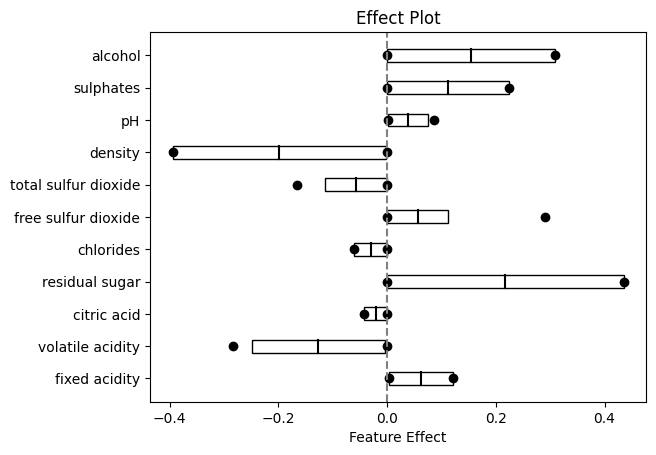

In [ ]:
import numpy as np

effect = model.coef_ * X_train

half_effect = effect[int(len(effect) * 0.25) : int(len(effect) * 0.75)]

min_values = np.min(half_effect, axis=0)  # box range (min)
max_values = np.max(half_effect, axis=0)  # box range (max)

# m_half_eff = np.mean(half_effect, axis=0)  # katheti grammi
m_half_eff = (max_values + min_values) / 2  # katheti grammi

iqr = effect.quantile(0.75) - effect.quantile(0.25)
max_iqr = 1.5 * iqr / np.sqrt(len(effect))  # orizonties (range max)
min_iqr = -max_iqr  # orizonties (range min)

# q1, q3 = np.percentile(effect, [25, 75], axis=0)
# iqr = q3 - q1
# max_iqr = q3 + 1.5 * iqr
# min_iqr = q1 - 1.5 * iqr

dot_min = np.min(effect, axis=0)  # dots (min)
dot_max = np.max(effect, axis=0)  # dots (max)

# Effect Plot:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

column_names = X_train.columns

fig, ax = plt.subplots()

for i, feature in enumerate(column_names):
    # Vertical line at m_half_eff
    ax.plot([m_half_eff[i], m_half_eff[i]], [i - 0.2, i + 0.2], color='black')

    # Horizontal lines representing min_iqr to max_iqr
    ax.hlines(y=i, xmin=min_iqr[i], xmax=max_iqr[i], color='blue')

    # Draw a box representing the range from min_values to max_values
    box = Rectangle((min_values[i], i - 0.2), max_values[i] - min_values[i], 0.4, edgecolor='black', facecolor='none')
    ax.add_patch(box)

    # Dots specified in dot_min and dot_max
    ax.plot(dot_min[i], i, 'o', color='black')
    ax.plot(dot_max[i], i, 'o', color='black')

ax.set_yticks(range(len(column_names)))
ax.set_yticklabels(column_names)
ax.axvline(x=0, linestyle='--', color='gray')
plt.title('Effect Plot')
plt.xlabel('Feature Effect')

# Show the plot
plt.show()


Σύμφωνα με το παραπάνω διάγραμμα, τα χαρακτηριστικά με τη μεγαλύτερη θετική συνεισφορά είναι το "density" όπως μπορούμε να δούμε από το μέγεθος των κουτιών (ύστερα ακολουθεί το γνώρισμα "alcohol"). Τη μεγαλύτερη αρνητική συνεισφορά την έχει "residual sugar" και έπειτα ακολουθεί το "volatile acidity".

Weight Plot:

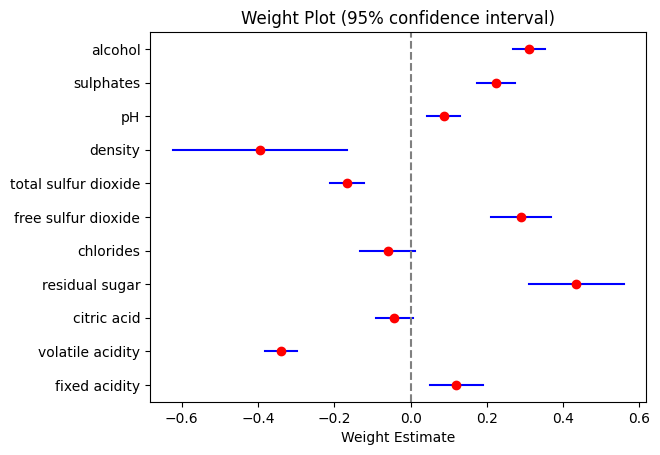

In [ ]:
import statsmodels.api as sm
import numpy as np

X_train_weight = sm.add_constant(X_train) # adding a constant

model_w = sm.OLS(y_train, X_train_weight)
results = model_w.fit()

ci = results.conf_int(alpha=0.05) # 95% confidence interval

y_values = list(ci.index)[1:]
lower_bound = np.array(ci[0])[1:]
upper_bound = np.array(ci[1])[1:]
coeffs = np.array(results.params)[1:]

fig, ax = plt.subplots()

for y, lower, upper in zip(y_values, lower_bound, upper_bound):
    ax.plot([lower, upper], [y, y], color='blue')

for y, param in zip(y_values, coeffs):
    ax.plot(param, y, 'ro')  # 'ro' for red dots

ax.axvline(x=0, linestyle='--', color='gray')
ax.set_xlabel('Weight Estimate')
ax.set_title('Weight Plot (95% confidence interval)')

plt.show()

Παρατηρούμε ότι η επίδραση του γνωρίσματος "residual sugar" έχει τη μεγαλύτερη θετική επίδραση (σε σχέση με τα υπόλοιπα γνωρίσματα) και μετά ακολουθεί το free sulfur dioxide. Την μεγαλύτερη αρνητική επίδραση την έχει το γνώρισμα "density".

Από την άλλη τα γνωρίσματα όπως το pH, clorides, citric acid, fixed acidity δεν έχουν στατιστικά σημαντική επίδραση στη πρόβλεψη.

**Παρατήρηση:** Οι προβέψεις έχουν διάστημα εμπιστοσύνης 95%.

### Ζητούμενο C

Selected Instance: 4586
Predicted value of instance: 0.48272093673734917
Average predicted value: 0.47384375257908423


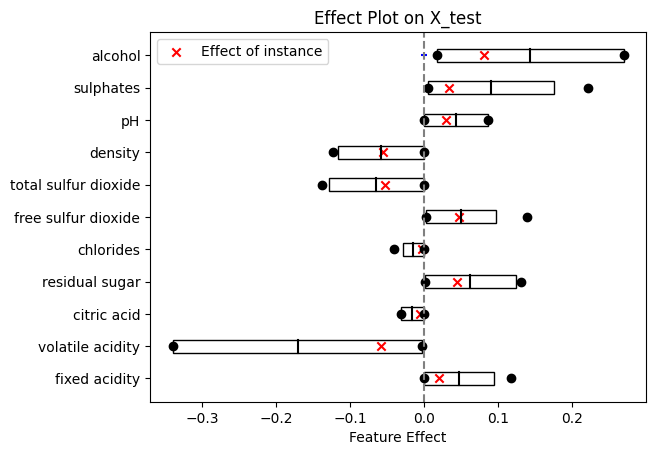

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

effect = model.coef_ * X_test

half_effect = effect[int(len(effect) * 0.25) : int(len(effect) * 0.75)]

min_values = np.min(half_effect, axis=0)  # box range (min)
max_values = np.max(half_effect, axis=0)  # box range (max)

# m_half_eff = np.mean(half_effect, axis=0)  # katheti grammi
m_half_eff = (max_values + min_values) / 2  # katheti grammi

iqr = effect.quantile(0.75) - effect.quantile(0.25)
max_iqr = 1.5 * iqr / np.sqrt(len(effect))  # orizonties (range max)
min_iqr = -max_iqr  # orizonties (range min)

dot_min = np.min(effect, axis=0)  # dots (min)
dot_max = np.max(effect, axis=0)  # dots (max)

# Effect Plot:
column_names = X_train.columns

fig, ax = plt.subplots()

for i, feature in enumerate(column_names):
    # Vertical line at m_half_eff
    ax.plot([m_half_eff[i], m_half_eff[i]], [i - 0.2, i + 0.2], color='black')

    # Horizontal lines representing min_iqr to max_iqr
    ax.hlines(y=i, xmin=min_iqr[i], xmax=max_iqr[i], color='blue')

    # Draw a box representing the range from min_values to max_values
    box = Rectangle((min_values[i], i - 0.2), max_values[i] - min_values[i], 0.4, edgecolor='black', facecolor='none')
    ax.add_patch(box)

    # Dots specified in dot_min and dot_max
    ax.plot(dot_min[i], i, 'o', color='black')
    ax.plot(dot_max[i], i, 'o', color='black')

X_instance = effect.sample(n=1, random_state=42)
values = X_instance.values[0]
ax.scatter(values, range(len(values)), marker='x', color='red', label=f'Effect of instance')

ax.set_yticks(range(len(column_names)))
ax.set_yticklabels(column_names)
ax.axvline(x=0, linestyle='--', color='gray')
plt.title('Effect Plot on X_test')
plt.xlabel('Feature Effect')
plt.legend()

print(f"Selected Instance: {X_instance.index[0]}")
print(f"Predicted value of instance: {model.predict(X_instance).item()}")
print(f"Average predicted value: {np.mean(model.predict(X_test))}")

plt.show()

Παρατηρούμε ότι το predicted value του συγκεκριμένου δείγματος είναι **μεγαλύτερο** από το μέσο predicted value.

Από το σχήμα, μπορούμε να δούμε ότι η επίδραση του instance για κάθε γνώρισμα είναι εντός του αναμενόμενου range. Συγκεκριμένα, οι επιδράσεις του δείγματος φαίνονται από τα κόκκινα "Χ" στο διάγραμμα.

# Περιγραφή 2

## Κώδικας

Import required libraries

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

Load the dataset as mentioned in the tutorial of the dataset ([import in python](https://archive.ics.uci.edu/dataset/222/bank+marketing)).

In [ ]:
!pip install ucimlrepo

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
bank_marketing = fetch_ucirepo(id=222)

# data (as pandas dataframes)
X = bank_marketing.data.features
y = bank_marketing.data.targets

# Prepare the dataset as mentioned in the description 2.
data = pd.concat([X, y], axis=1)
data.rename(columns={"y": 'target'}, inplace=True)

data.drop(columns=['day_of_week','month'], inplace=True)  # drops columns before they do not exist in description 2 of the exercise.

# converts 'no' and 'yes' to 0 and 1 of target column.
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
data['target']= label_encoder.fit_transform(data['target'])

data

,age,job,marital,education,default,balance,housing,loan,contact,duration,campaign,pdays,previous,poutcome,target
0,58,management,married,tertiary,no,2143,yes,no,NaN,261,1,-1,0,NaN,0
1,44,technician,single,secondary,no,29,yes,no,NaN,151,1,-1,0,NaN,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,76,1,-1,0,NaN,0
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,92,1,-1,0,NaN,0
4,33,NaN,single,NaN,no,1,no,no,NaN,198,1,-1,0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,977,3,-1,0,NaN,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,456,2,-1,0,NaN,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,508,4,-1,0,NaN,0


Preprocessing: Convert categorical variables to numerical using one-hot encoding

In [ ]:
data = pd.get_dummies(data, columns=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'poutcome'])

Normalize values (range 0 to 1):

In [ ]:
from sklearn import preprocessing

x = data.values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
data = pd.DataFrame(x_scaled, columns=data.columns)
# data

Execute description 2 code:

In [ ]:
# Split the dataset into features (X) and target (y)
X = data.drop('target', axis=1)
y = data['target']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
# Train the classifier on the training data
rf_classifier.fit(X_train, y_train)
# Make predictions on the test data
y_pred = rf_classifier.predict(X_test)
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.90


## Ζητούμενα

### Ζητούμενο Α

Computing partial dependence plots...
done in 468.839s


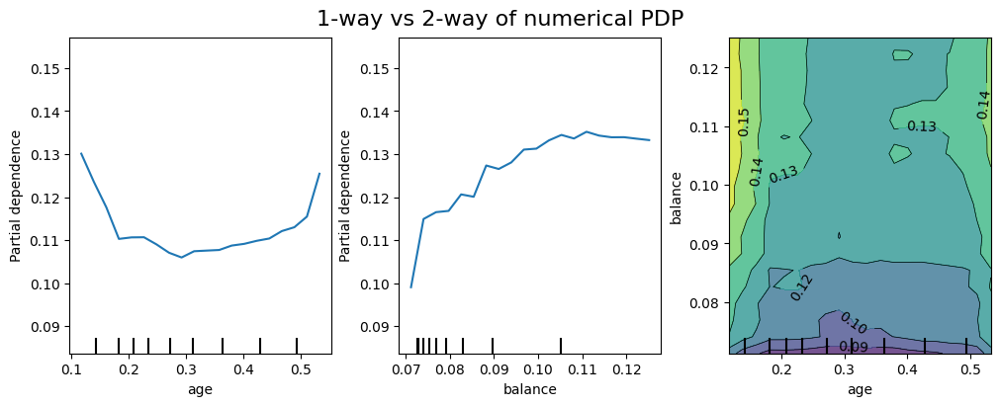

In [ ]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay
from time import time

common_params = {
    "subsample": 50,
    "n_jobs": 2,
    "grid_resolution": 20,
    "random_state": 0,
}

print("Computing partial dependence plots...")
features_info = {
    "features": ["age", "balance", ("age", "balance")],
    "kind": "average",
}
_, ax = plt.subplots(ncols=3, figsize=(10, 4), constrained_layout=True)
tic = time()
display = PartialDependenceDisplay.from_estimator(
    rf_classifier,
    X,
    **features_info,
    ax=ax,
    **common_params,
)
print(f"done in {time() - tic:.3f}s")
_ = display.figure_.suptitle(
    "1-way vs 2-way of numerical PDP", fontsize=16
)

* Το πρώτο (αριστερά) γράφημα δείχνει τη μερική εξάρτηση έναντι της 'Ηλικίας'. Μια μπλε γραμμή σε αυτό το πρώτο διάγραμμα υποδεικνύει μια αρχική μείωση της μερικής εξάρτησης καθώς αυξάνεται η ηλικία, ακολουθούμενη από μια αύξηση σχηματίζοντας σχήμα U.

* Το μεσαίο γράφημα απεικονίζει μερική εξάρτηση έναντι του 'Μέσου Υπόλοιπου', με τιμές που κυμαίνονται από περίπου 0.07 έως περίπου 0.12 για την ισορροπία. Βλέπουμε ότι όσο αυξάνεται το balance, αυξάνεται και η μερική εξάρτηση, μέχρι που "σταθεροποιείται" στο 0.1.

* Το τελευταίο δεξιά γράφημα δείχνει πως επιδρά το μέσο υπόλοιπο με την ηλικία στην μερική εξάρτηση. Παρατηρούμε ότι αν το age < 0.15 (περίπου) και το balance είναι στο διάστημα [0.1, 0.12] η μερική εξάρτηση είναι ψηλότερη (άρα η επίδραση στην πρόβλεψη του μοντέλου είναι μεγαλύτερη).

### Ζητούμενο Β

Install & Import necessary libraries:

In [ ]:
!pip install PyALE
from PyALE import ale
import matplotlib.pyplot as plt

Plot 1D & 2D ALE

INFO:PyALE._ALE_generic:Discrete feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.


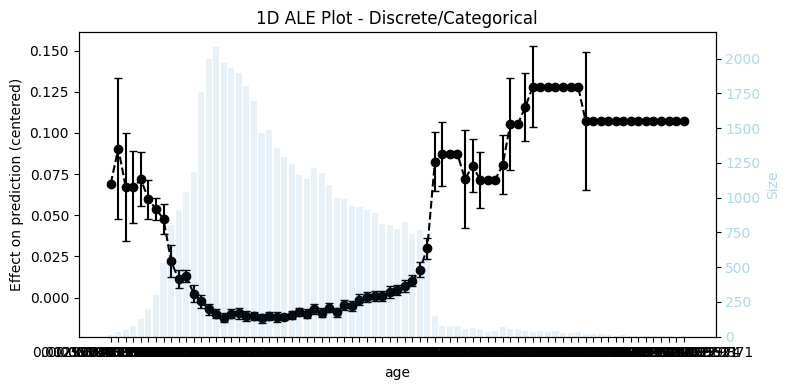

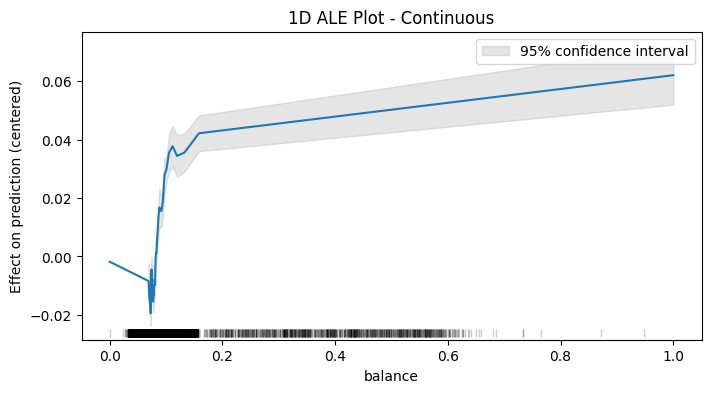

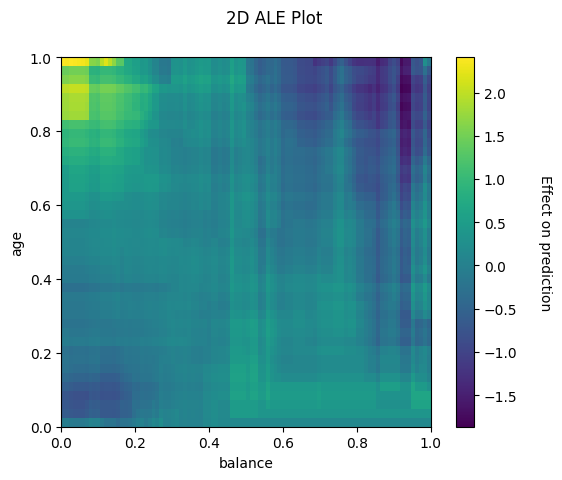

In [ ]:
_ = ale(X, model=rf_classifier, feature=['age'], include_CI=True, grid_size=50, C=0.95)
_ = ale(X, model=rf_classifier, feature=['balance'], include_CI=True, grid_size=50, C=0.95)
_ = ale(X, model=rf_classifier, feature=["age", "balance"], grid_size=100)

* Στο πρώτο γράφημα, παρατηρούμε ότι αν το age βρίσκεται (περίπου) στο [0.8, 1] έχει υψηλή επίδραση στις προβλέψεις.

* Στο δεύτερο γράφημα, βλέπουμε ότι όσο αυξάνεται το balance, τόσο μεγαλύτερη επίδραση έχει στις προβλέψεις (γενικώς όμως έχει χαμηλότερη επίδραση από το 'age').

* Συνδυαστικά το balance, prediction στο τελευταίο γράφημα παρατηρούμε ότι το μεγαλύτερο effect στο prediction το έχουμε στις τιμές [0, 0.2] για το balance και [0.8, 1] για το age.


### Ζητούμενο C

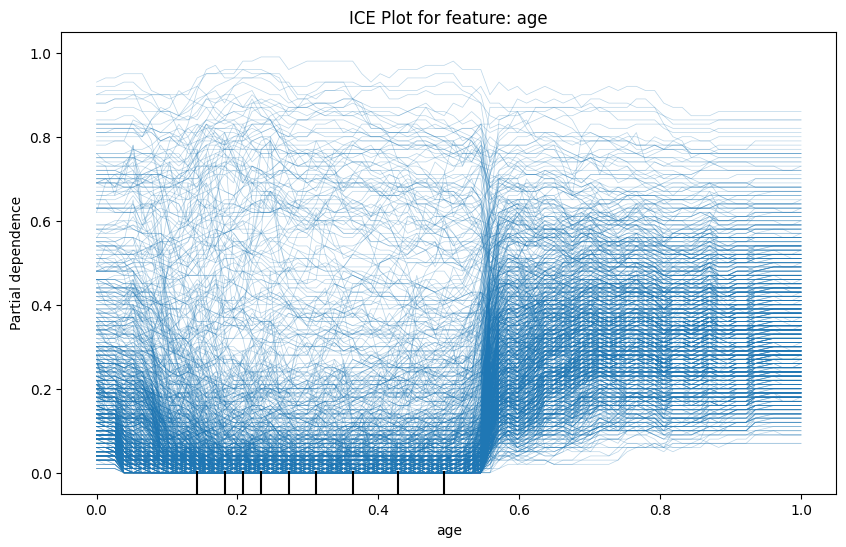

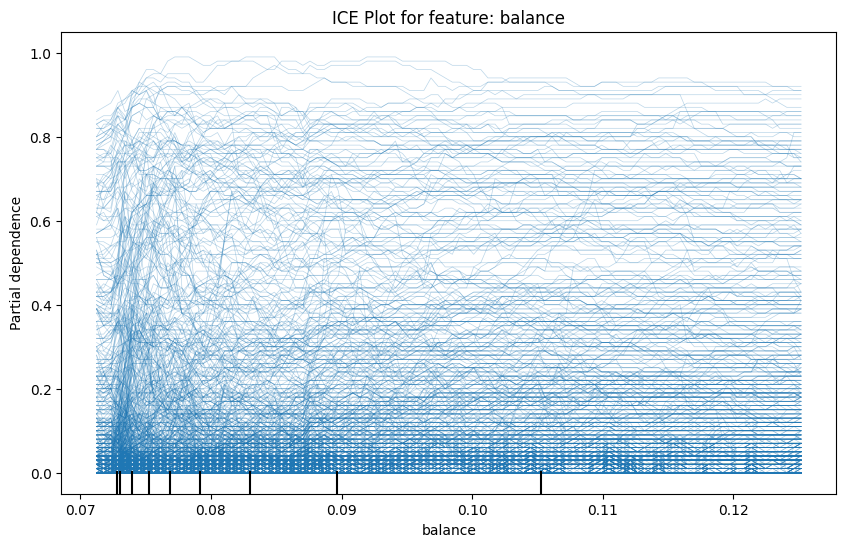

In [ ]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# Generate ICE plot for the age
fig, ax = plt.subplots(figsize=(10, 6))
PartialDependenceDisplay.from_estimator(rf_classifier, X, features=['age'], kind='individual', ax=ax)
# Enhancing the plot
ax.set_title(f'ICE Plot for feature: age')
ax.set_ylabel('y')
ax.set_xlabel("age")
plt.show()

# Generate ICE plot for the balance
fig, ax = plt.subplots(figsize=(10, 6))
PartialDependenceDisplay.from_estimator(rf_classifier, X, features=['balance'], kind='individual', ax=ax)
# Enhancing the plot
ax.set_title(f'ICE Plot for feature: balance')
ax.set_ylabel('y')
ax.set_xlabel('balance')
plt.show()

* Τα γραφήματα ICE αναπαριστούν μία γραμμή ανά εμφάνιση που δείχνει πώς μεταβάλλεται η πρόβλεψη όταν αλλάζει ένα χαρακτηριστικό.

* Στο πρώτο διάγραμμα παρατηρούμε μια γενική άνοδο της συσχέτισης της ηλικίας όταν εκείνη ξεπερνά το 0.55, ενώ όταν είναι μικρότερη από 0.55 είναι συγκριτικά χαμηλή.

* Στο δεύτερο διάγραμμα παρατηρούμε πως το balance έχει σταθερά θετική και ελαφρώς αυξανόμενη συσχέτιση με την προβλεπόμενη τιμή καθώς δε συναντάμε κάποια απότομη μεταβολή του Dependence κατά την μεταβολή της τιμής του balance.

### Ζητούμενο D

duration: 0.3188275234414233
balance: 0.15021630308473524
age: 0.13757743113919396
pdays: 0.05353729321301127
campaign: 0.05274097670076585
poutcome_success: 0.050552062574450676
previous: 0.0287594732906689
contact_cellular: 0.01551606883277653
housing_no: 0.012741740732215125
education_secondary: 0.01255637389552153
housing_yes: 0.011571242153297131
education_tertiary: 0.010961458877395145
job_technician: 0.010943885485328824
job_management: 0.01004837767604734
marital_married: 0.009876808869636248
job_admin.: 0.009543364352617573
poutcome_failure: 0.009085016441538753
marital_single: 0.008931183565276354
job_blue-collar: 0.008458470725610347
education_primary: 0.00744998715475661
marital_divorced: 0.007259203982436037
loan_no: 0.006942178317609927
job_services: 0.006601447614992255
loan_yes: 0.006543977695879306
contact_telephone: 0.005905722877847891
poutcome_other: 0.005549525731287055
job_retired: 0.0053371336810922815
job_self-employed: 0.0052166350252538
job_unemployed: 0.00511

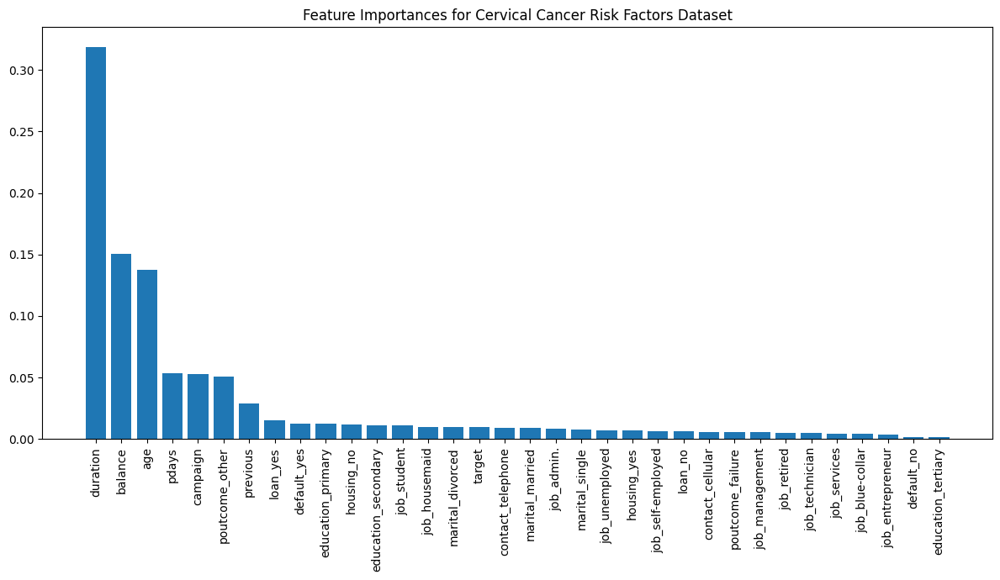

In [ ]:
import numpy as np
importances_cervical = rf_classifier.feature_importances_

feature_importance = list(zip(X.columns, importances_cervical))
feature_importance = sorted(feature_importance, key=lambda x: x[1], reverse=True)
# Print feature names and their importance values
for feature_name, importance in feature_importance:
    print(f"{feature_name}: {importance}")

# Sorting the features based on importance and plotting
indices_cervical = np.argsort(importances_cervical)[::-1]
plt.figure(figsize=(12, 7))
plt.title("Feature Importances for Cervical Cancer Risk Factors Dataset")
plt.bar(range(X.shape[1]), importances_cervical[indices_cervical], align="center")
plt.xticks(range(X.shape[1]), np.array(data.columns)[indices_cervical], rotation=90)
plt.tight_layout()
plt.show()


Παρατηρούμε ότι η διάρκεια είναι το πιο σημαντικό feature (σήμφωνα με τη μετρική σπουδαιότητας) και μετά ακολουθούν το μέσο υπόλοποιπο και η ηλικία. Τα υπόλοιπα feautures έχουν σχετικά χαμηλή σημαντικότητα.

### Ζητούμενο Ε:

Από τα ερωτήματα A, B, C βλέπουμε συνολικά τις συσχετίσεις μεταξύ των age, balance καθώς και την επίδραση που έχουν προς τις προβλέψεις του μοντέλου.

Από τα διαγράμματα μπορούμε να βγάλουμε τα εξής συμπεράσματα / παρατηρήσεις:

1. Το balance και το age έχουν "αντίστροφη" σχέση στα διαγράμματα του Α και Β. Σγκεκρικμένα, στο Α η μερική εξάρτηση είναι μεγαλύτερη όταν το balance είναι μεγάλο και το age μικρό. Αντίθετα, στο Β υπάρχει μεγαλύτερη επίδραση στη πρόβλεψη όταν το age είναι μεγάλο και το balance μικρό.
2. Το διάγραμμα C "συνδυάζει" τα αποτέλεσματα του Α και Β, καθώς σε αυτό όσο "μεγαλώνει" το age, αυξάνεται η μερική εξάρτηση (όπως το Β) και όσο μεγαλώνει το balance, αυξάνεται επίσης η μερική εξάρτηση (όπως το Α).

# Περιγραφή 3

## Κώδικας

Import required libraries

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

Copy the dataset from colab:

In [ ]:
!cp '/content/drive/My Drive/HCI/boston_housing.csv' .

Load dataset


In [ ]:
data = pd.read_csv('boston_housing.csv') # Replace with your file path
# data

Normalize values (range 0 to 1) for better results:

In [ ]:
from sklearn import preprocessing

x = data.values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
data = pd.DataFrame(x_scaled, columns=data.columns)
data

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.000000,0.18,0.067815,0.0,0.314815,0.577505,0.641607,0.269203,0.000000,0.208015,0.287234,1.000000,0.089680,0.422222
1,0.000236,0.00,0.242302,0.0,0.172840,0.547998,0.782698,0.348962,0.043478,0.104962,0.553191,1.000000,0.204470,0.368889
2,0.000236,0.00,0.242302,0.0,0.172840,0.694386,0.599382,0.348962,0.043478,0.104962,0.553191,0.989737,0.063466,0.660000
3,0.000293,0.00,0.063050,0.0,0.150206,0.658555,0.441813,0.448545,0.086957,0.066794,0.648936,0.994276,0.033389,0.631111
4,0.000705,0.00,0.063050,0.0,0.150206,0.687105,0.528321,0.448545,0.086957,0.066794,0.648936,1.000000,0.099338,0.693333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.000633,0.00,0.420455,0.0,0.386831,0.580954,0.681771,0.122671,0.000000,0.164122,0.893617,0.987619,0.219095,0.386667
502,0.000438,0.00,0.420455,0.0,0.386831,0.490324,0.760041,0.105293,0.000000,0.164122,0.893617,1.000000,0.202815,0.346667
503,0.000612,0.00,0.420455,0.0,0.386831,0.654340,0.907312,0.094381,0.000000,0.164122,0.893617,1.000000,0.107892,0.420000
504,0.001161,0.00,0.420455,0.0,0.386831,0.619467,0.889804,0.114514,0.000000,0.164122,0.893617,0.991301,0.131071,0.377778


Execute description 3 code:

In [ ]:
# Split dataset
X = data.drop('medv', axis=1)
y = data['medv']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
# Create and train Random Forest model
model = RandomForestRegressor()
model.fit(X_train, y_train)
# Predict and evaluate
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Random Forest Mean Squared Error: {mse}')

Random Forest Mean Squared Error: 0.009988285165819408


## Ζητούμενα

### Ζητούμενο Α

In [ ]:
from sklearn.tree import DecisionTreeRegressor, export_text

rf_a = RandomForestRegressor()
rf_a.fit(X_train, y_train)
y_train_predictions = rf_a.predict(X_train)

dt_surrogate = DecisionTreeRegressor(max_depth=5)
dt_surrogate.fit(X_train, y_train_predictions)

# Evaluate the accuracy of the surrogate model on test data
print(f"Surrogate Decision Tree Accuracy: {dt_surrogate.score(X_test, y_test)*100:.2f}%")
# Extract decision rules from the surrogate model
rules = export_text(dt_surrogate, feature_names=list(X.columns))
print(rules)

Surrogate Decision Tree Accuracy: 69.51%
|--- rm <= 0.63
|   |--- lstat <= 0.35
|   |   |--- lstat <= 0.09
|   |   |   |--- ptratio <= 0.76
|   |   |   |   |--- rm <= 0.60
|   |   |   |   |   |--- value: [0.49]
|   |   |   |   |--- rm >  0.60
|   |   |   |   |   |--- value: [0.58]
|   |   |   |--- ptratio >  0.76
|   |   |   |   |--- lstat <= 0.05
|   |   |   |   |   |--- value: [0.85]
|   |   |   |   |--- lstat >  0.05
|   |   |   |   |   |--- value: [0.91]
|   |   |--- lstat >  0.09
|   |   |   |--- lstat <= 0.22
|   |   |   |   |--- rm <= 0.49
|   |   |   |   |   |--- value: [0.37]
|   |   |   |   |--- rm >  0.49
|   |   |   |   |   |--- value: [0.45]
|   |   |   |--- lstat >  0.22
|   |   |   |   |--- indus <= 0.09
|   |   |   |   |   |--- value: [0.46]
|   |   |   |   |--- indus >  0.09
|   |   |   |   |   |--- value: [0.35]
|   |--- lstat >  0.35
|   |   |--- crim <= 0.06
|   |   |   |--- nox <= 0.30
|   |   |   |   |--- nox <= 0.18
|   |   |   |   |   |--- value: [0.28]
|   |   

Παρατηρούμε πως το χαρατηριστικό RM (Μέσος αριθμός δωματίων ανά κατοικία) είναι από τα βασικά χαρακτηριστικά και καθορίζει σημαντικά τις προβλέψεις αξίας του ακινήτου, καθώς το συναντάμε σε πολλά σημεία κόμβων. Συγκεκριμένα, χαμηλές τιμές του 'RM' (<0.63) φαίνεται να συσχετίζονται με χαμηλές τιμές του στόχου (τιμή κατοικίας), ενώ υψηλότερες τιμές του 'RM' (> 0.74) συσχετίζονται με υψηλότερες τιμές κατοικιών.

Το χαρακτηριστικό LSTAT' (ποσοστό κατοίκων χαμηλού εισοδήματος) είναι επίσης αρκετά σημαντικός παράγοντας και παρατηρούμε ότι χαμηλά ποσοστά συνδέονται με υψηλότερες προβλεπόμενες τιμές κατοικιών, ενώ υψηλά ποσοστά (> 0.35) συνδέονται με χαμηλότερες.

Τέλος, το χαρακτηριστικό CRIM (αναλογία εγκληματικότητας) φαίνεται να έχει και αυτό κάποια σημασία καθώς χαμηλές τιμές συνδέονται με μεγαλύτερες προβλεπόμενες τιμές.

### Ζητούμενο Β

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=a3e2afdae2a4fa9f2e2733efe9c44683127d0c382c89468e184dbc63e163e5f2
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


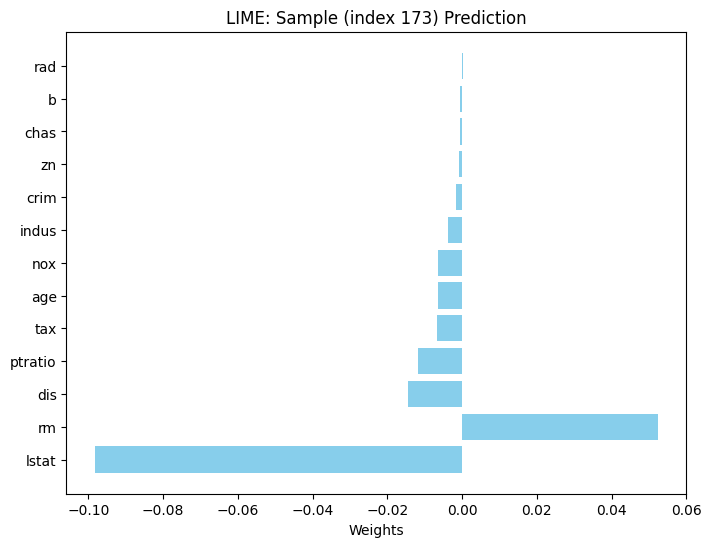

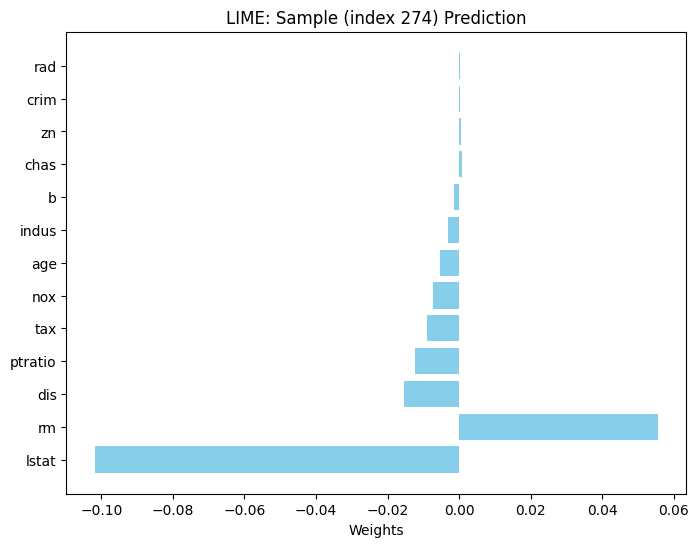

In [ ]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import matplotlib.pyplot as plt

samples = X.sample(n=2, random_state=42)

explainer = LimeTabularExplainer(X, feature_names=X.columns.tolist(), discretize_continuous=False, mode='regression')

# Generate explanations for the two samples
for i in range(2):
    exp = explainer.explain_instance(samples.iloc[i], model.predict, num_features=len(X.columns.tolist()))
    # print(exp.as_list())
    features = [x[0] for x in exp.as_list()]
    weights = [x[1] for x in exp.as_list()]

    # Creating a bar plot
    plt.figure(figsize=(8, 6))
    plt.barh(features, weights, color='skyblue')
    plt.xlabel('Weights')
    plt.title(f'LIME: Sample (index {samples.index[i]}) Prediction')
    plt.show()
    # for feature, weight in exp.as_list():
    #     print(f"{feature}: {weight:.3f}")

Για τα 2 επιλεγμένα δείγματα παρατηρούμε πως το χαρακτηριστικό LSTAT έχει αρνητική συσχέτιση με τη τιμή των κατοικιών. Συνεπώς όσο αυξάνεται η τιμή του LSTAT, τόσο χαμηλή τιμή περιμενουμε να είναι η τιμή της κατοικίας και ομοίως όσο μειώνεται η τιμη του LSTAT περιμένουμε τη τιμή της κατοικίας να είναι υψηλή.

Όσον αφορά το χαρακτηριστικό RM παρατηρούμε πως έχει θετική συσχέτιση με την τιμή της κατοικίας. Δηλαδή, όταν η τιμη του RM είναι υψηλή περιμένουμε να είναι υψηλή και η τιμή της κατοικίας και όταν η τιμή του RM είναι χαμηλή περιμένουμε τη τιμή της κατοικίας να είναι εξίσου χαμηλή.

Τέλος, το χαρακτηριστικό CRIM βλέπουμε πως έχει μια ελαφρα αρνητική συσχέτιση αλλά κατά κύριο λόγο δεν επηρεάζει σημαντικά τη τιμή μιας κατοικίας καθώς σύμφωνα με το διάγραμμα η συσχέτισή του είναι κοντά στο 0.

# Περιγραφή 4

## Κώδικας

Import required libraries

In [ ]:
# Import SHAP and XGBoost method libraries
!pip install shap
!pip install xgboost
import xgboost
import shap
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 4.8 MB/s eta 0:00:00


Load the dataset as mentioned in the tutorial of the dataset ([import in python](https://archive.ics.uci.edu/dataset/45/heart+disease)).

In [ ]:
!pip install ucimlrepo

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
bank_marketing = fetch_ucirepo(id=45)

# data (as pandas dataframes)
X = bank_marketing.data.features
y = bank_marketing.data.targets

# Prepare the dataset as mentioned in the description 2.
data = pd.concat([X, y], axis=1)
data.rename(columns={"num": 'target_column'}, inplace=True) # renames target column to match description 4 code target column.
print(data.shape)
# data

(303, 14)


Drop nan values and normalize data:

In [ ]:
data = data.dropna()
print(data.shape)
from sklearn import preprocessing

x = data.values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
data = pd.DataFrame(x_scaled, columns=data.columns)
data

(297, 14)


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target_column
0,0.708333,1.0,0.000000,0.481132,0.244292,1.0,1.0,0.603053,0.0,0.370968,1.0,0.000000,0.75,0.00
1,0.791667,1.0,1.000000,0.622642,0.365297,0.0,1.0,0.282443,1.0,0.241935,0.5,1.000000,0.00,0.50
2,0.791667,1.0,1.000000,0.245283,0.235160,0.0,1.0,0.442748,1.0,0.419355,0.5,0.666667,1.00,0.25
3,0.166667,1.0,0.666667,0.339623,0.283105,0.0,0.0,0.885496,0.0,0.564516,1.0,0.000000,0.00,0.00
4,0.250000,0.0,0.333333,0.339623,0.178082,0.0,1.0,0.770992,0.0,0.225806,0.0,0.000000,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,0.583333,0.0,1.000000,0.433962,0.262557,0.0,0.0,0.396947,1.0,0.032258,0.5,0.000000,1.00,0.25
293,0.333333,1.0,0.000000,0.150943,0.315068,0.0,0.0,0.465649,0.0,0.193548,0.5,0.000000,1.00,0.25
294,0.812500,1.0,1.000000,0.471698,0.152968,1.0,0.0,0.534351,0.0,0.548387,0.5,0.666667,1.00,0.50
295,0.583333,1.0,1.000000,0.339623,0.011416,0.0,0.0,0.335878,1.0,0.193548,0.5,0.333333,1.00,0.75


Train and initialize SHAP:

In [ ]:
X = data.drop('target_column', axis=1)
y = data['target_column']
# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Train an XGBoost regression model
model = xgboost.XGBRegressor(objective='reg:squarederror')
model.fit(X_train, y_train)
#Estimate the SHAP values for each dataset sample
explainer = shap.Explainer(model)
shap_values = explainer(X)
sample_index = 0

[11:52:39] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
[11:52:40] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


## Ζητούμενα

### Ζητούμενο Α:

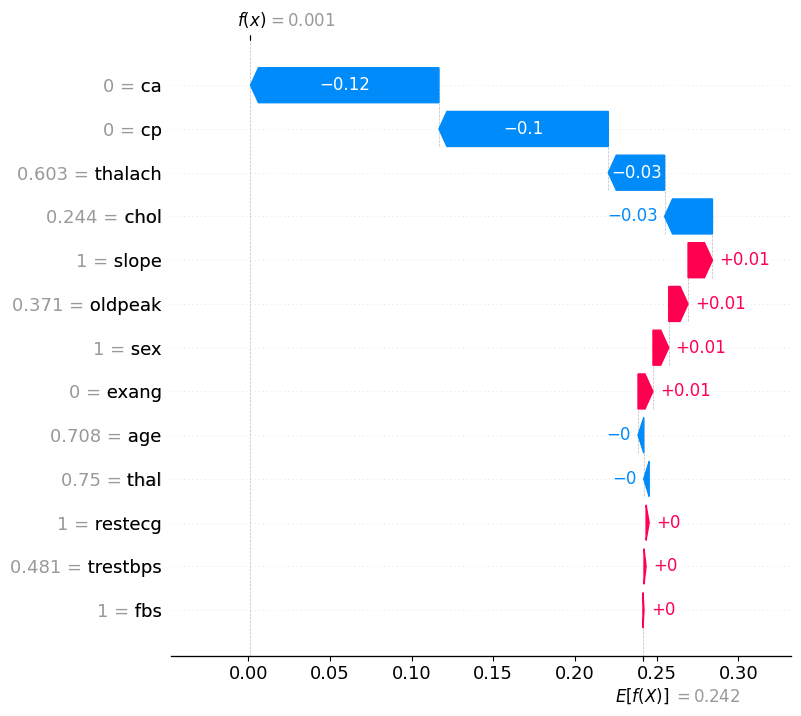

In [ ]:
# Visualize sample SHAP values for given example (local explanation)
shap.plots.waterfall(shap_values[sample_index], max_display=len(X.columns))

Παρατηρούμε ότι, **για το συγκεκριμένο δείγμα**, τα γνωρίσματα ca, cp, thalach, chol, thal και age (μπλέ μπάρες) έχουν αρνητική επίδραση στην πρόβλεψη, ενώ τα γνωρίσματα όπως το slope, oldpeak, sex, exang, restecg, trestbps και fbs (κόκκινες μπάρες) έχουν θετική επίδραση.

Επιπρόσθετα, το γνώρισμα ca έχει τη μεγαλύτερη αρνητική επίδραση (μετά ακολουθεί το cp και ύστερα το thalach), ενώ το γνώρισμα slope έχει τη μεγαλύτερη θετική επίδραση (και έπειτα ακολουθεί το oldpeak).

### Ζητούμενο Β:

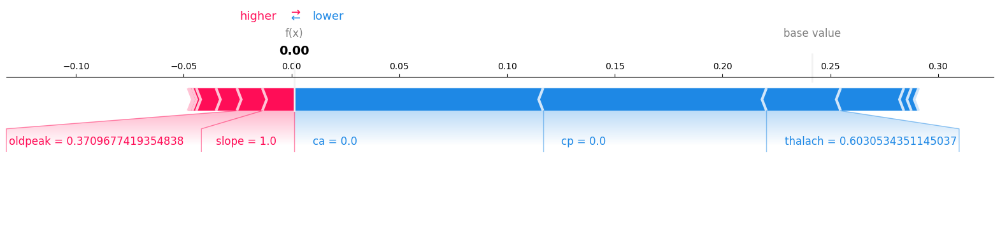

In [ ]:
# Visualize (SHAP-based) sample force plot for given example (local explanation)
shap.plots.force(shap_values[sample_index], matplotlib=True)

Παρατηρούμε ότι τα γνωρίσματα "oldpeak" και "slope" αυξάνουν την πρόβλεψη (σε σχέση με την μέση πρόβλεψη), ενώ τα features όπως το "ca", "cp" και "thalach" μειώνουν την πρόβλεψη **για το συγκεκριμένο δείγμα**.

### Ζητούμενο C:

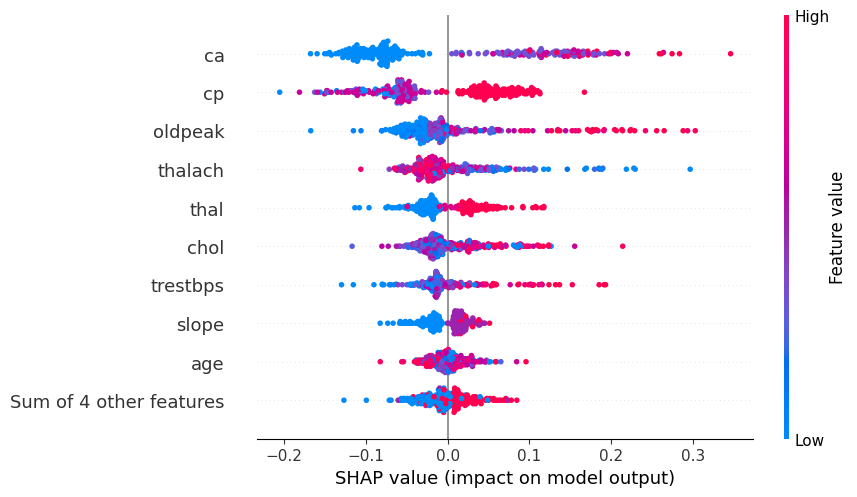

In [ ]:
# Visualize (SHAP-based) summary plot of the effects of all features for all dataset samples (global explanation)
shap.plots.beeswarm(shap_values)

Παρατηρούμε ότι τα γνωρίσματα όπως το ca, cp, oldpeak, thalach έχουν μεγαλύτερη επίδραση στη πρόβλεψη.

Επίσης, βλέπουμε ότι χαμηλός αριθμός ca μειώνει το αποτέλεσμα της πρόβλεψης, ενώ όσο αυξάνεται το ca, αυξάνεται και το αποτέλεσμα (της πρόβλεψης). Όμοια συμπεριφορά έχουν και τα γνωρίσματα cp, oldpeak.

Από την άλλη πλευρά, το γνώρισμα thalach όσο μειώνεται, αυξάνει το αποτέλεσμα της πρόβλεψης, ενώ όσο αυξάνεται, το μειώνει (το αποτέλεσμα).

### Ζητούμενο D:

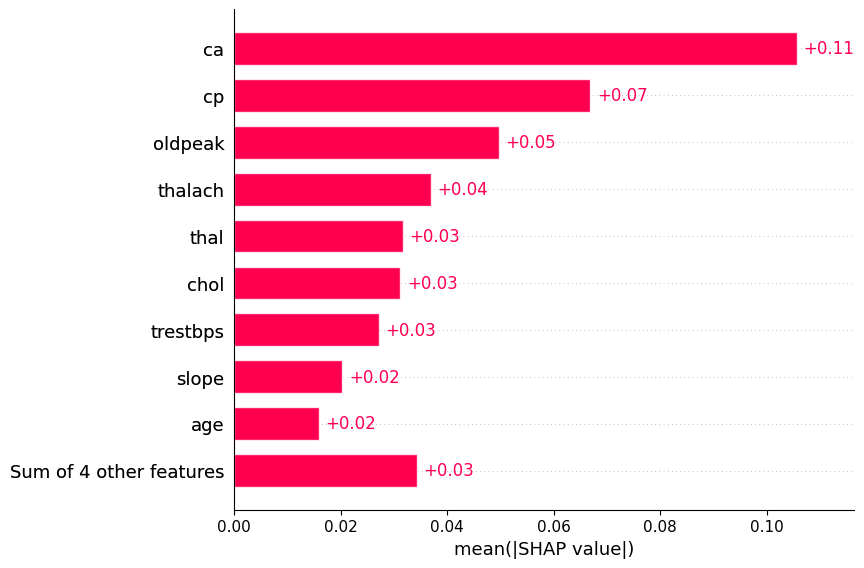

In [ ]:
# Visualize mean absolute value of SHAP values for each feature for all dataset samples (global explanation)
shap.plots.bar(shap_values)

Παρατηρούμε ότι τα γνωρίσματα όπως το ca, cp έχουν τις μεγαλύτερες επιπτώσεις στη μέση τιμή πρόβλεψης (κατά 11% και 7% αντίστοιχα). 'Υστερα, ακολουθεί το oldpeak με επίπτωση (στη μέση τιμή πρόβλεψης) 5%. Τα υπόλοιπα features έχουν επίπτωση μικρότερη ή ίση του 4%.

### Ζητούμενο Ε:

In [ ]:
# Visualize interactive (SHAP-based) force plot for all samples in the dataset (global explanation)
shap.initjs()
shap.plots.force(shap_values)

**Παρατηρήσεις:**

Βλέποντας το παραπάνω γράφημα (y axis = f(x) και x axis = sample order by similarity) και συγκρίνοντας το με το y axis = ca effects, βλέπουμε ότι το ca έχει μεγάλη επίπτωση στη πρόβλεψη (αφού όταν αυξάνεται ή μειώνεται, πολλές φορές αλλάζει με όμοιο τρόπο και η πρόβλεψη).

Σχεδόν το ίδιο (με λιγότερη επίδραση από το ca) μπορούμε να παρατηρήσουμε και για το cp (αν y axis = cp effects).

---
**Εξηγήσεις**

Οι παρατηρήσεις αυτές είναι "δικαιολογημένες" καθώς από το ζητούμενο D είδαμε πως την ψηλότερη επίδραση στη μέση πρόβλεψη την είχαν τα ca, cp.

---

**Παραδείγματα:**

Επίσης, αν βάλουμε x = original sample ordering και πάμε στο x = 0 (όπου αυτό είναι το sample index των ζητούμενων Α και Β) βλέπουμε ομοιότητες με τα ζητούμενα Α και Β. Συγκεκριμένα, παρατηρούμε ότι οι τιμές των γνωρισμάτων είναι πάρα πολύ κοντά σε αυτές του Β ερωτήματος (αν αλλάξουμε τον άξονα y στις τιμές που περιγράφονται στο Β - oldpeak, slope, ca, cp, thalach).

Όσο για τα χρώματα (μπλε = μείωση πρόβλεψης και κόκκινο = αύξηση) βλέπουμε ότι είναι τα αντίστοιχα γνωρίσματα έχουν τα ίδια χρώματα με αυτά του Α και Β.

# Περιγραφή 5

Import libraries


In [ ]:
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

### Ζητούμενο Α:

#### Inception v1

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v1 (KerasLayer)   (None, 1001)              6633209   
                                                                 
Total params: 6633209 (25.30 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 6633209 (25.30 MB)
_________________________________________________________________


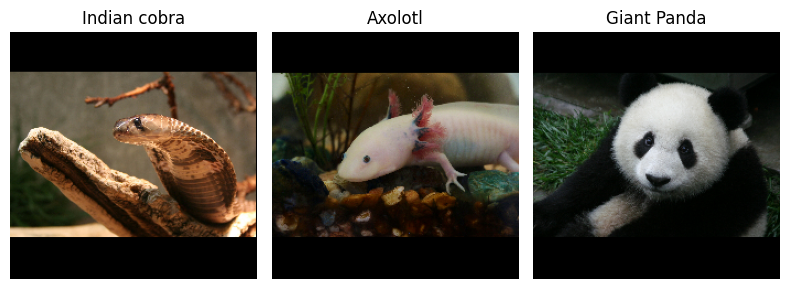

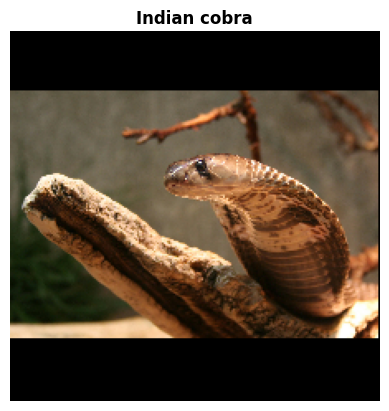

Indian cobra (concept index: 64): 68.4%
hognose snake (concept index: 55): 4.4%
night snake (concept index: 61): 4.0%
horned viper (concept index: 67): 1.3%
diamondback (concept index: 68): 1.2%


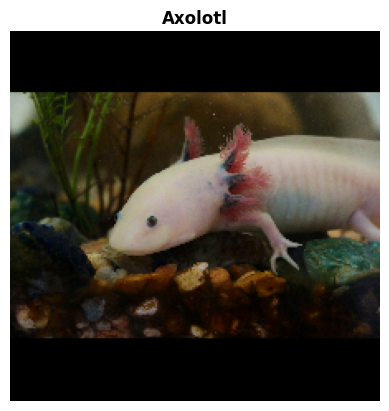

axolotl (concept index: 30): 100.0%
goldfish (concept index: 2): 0.0%
sulphur-crested cockatoo (concept index: 90): 0.0%
banded gecko (concept index: 39): 0.0%
common newt (concept index: 27): 0.0%


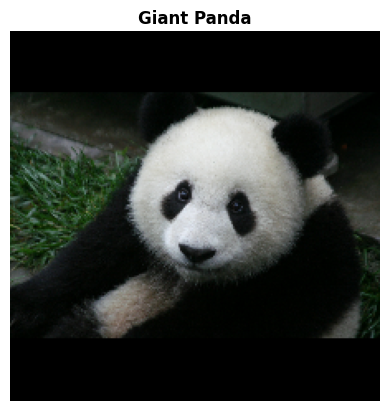

giant panda (concept index: 389): 89.4%
teddy (concept index: 851): 0.3%
gibbon (concept index: 369): 0.3%
colobus (concept index: 376): 0.2%
lesser panda (concept index: 388): 0.2%


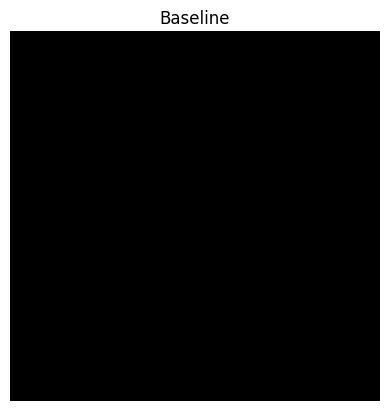

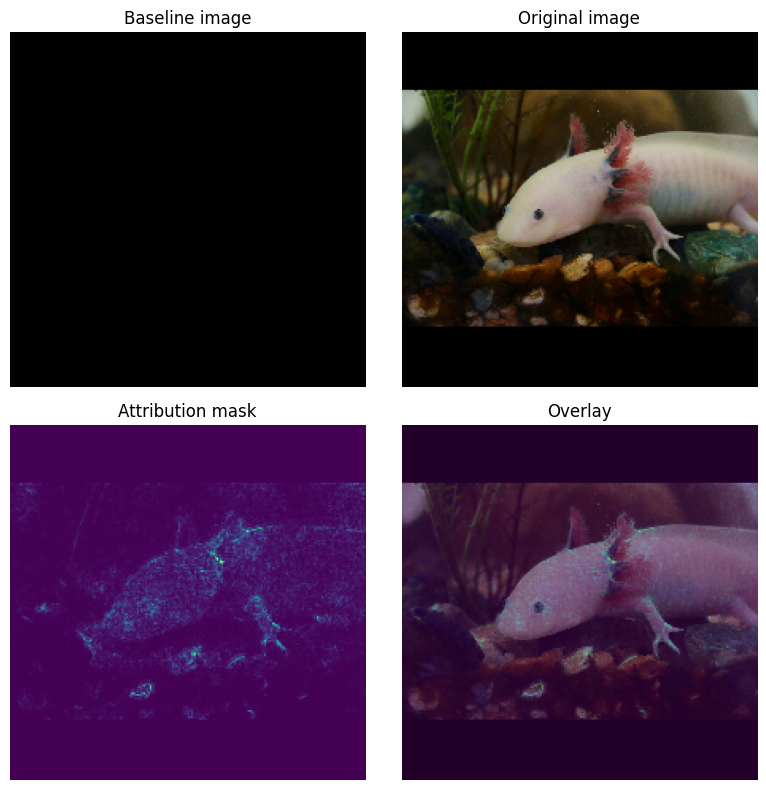

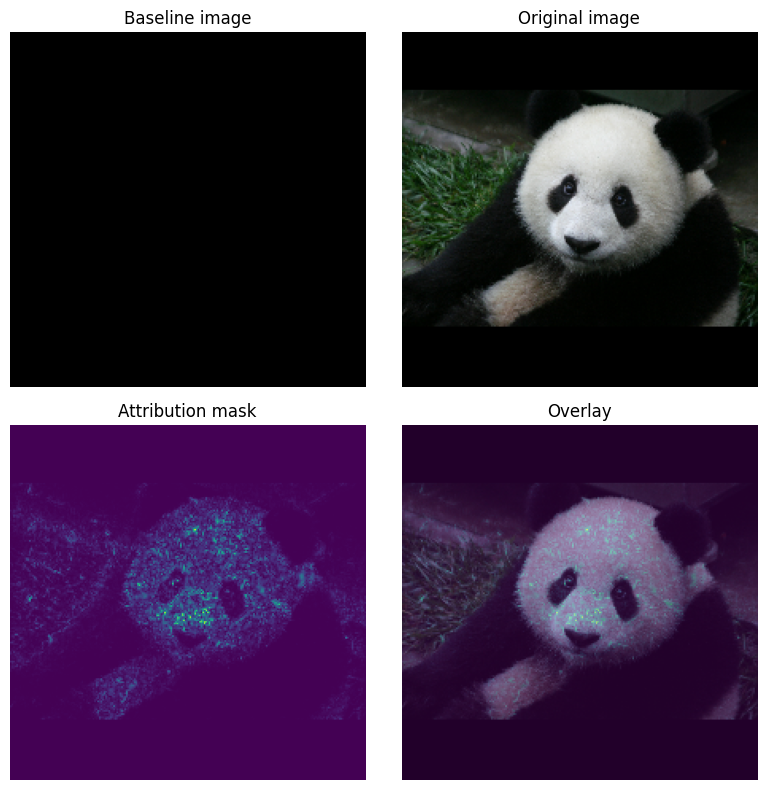

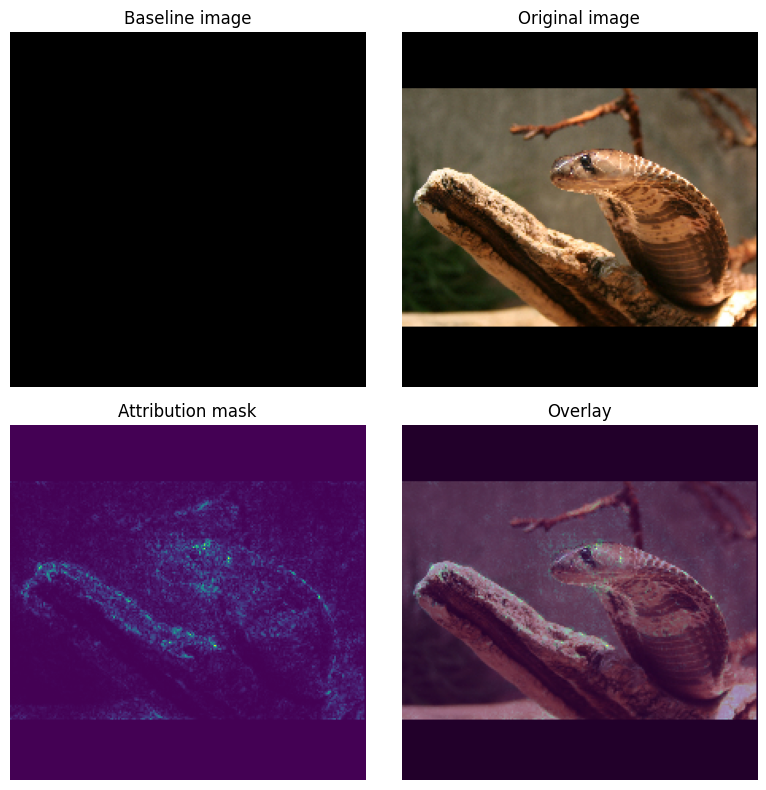

In [ ]:
#Download NN image classification model (any other (differential-learning) NN can be used instead)
model = tf.keras.Sequential([
  hub.KerasLayer(
  name='inception_v1',
  handle='https://tfhub.dev/google/imagenet/inception_v1/classification/4',
  # name='inception_v2',
  # handle='https://tfhub.dev/google/imagenet/inception_v2/classification/5',
  # name='inception_v3',
  # handle='https://tfhub.dev/google/imagenet/inception_v3/classification/5',
  # name='inception_resnet_v2',
  # handle='https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5',
  trainable=False),
])

model.build([None, 224, 224, 3])
model.summary()

#Import labels from Imagenet dataset
def load_imagenet_labels(file_path):
  labels_file = tf.keras.utils.get_file('ImageNetLabels.txt', file_path)
  with open(labels_file) as reader:
    f = reader.read()
    labels = f.splitlines()
  return np.array(labels)

imagenet_labels = load_imagenet_labels('https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')

#Import and visualize input images (any image can be used instead), assumed in jpg format
def read_image(file_name):
  image = tf.io.read_file(file_name)
  image = tf.io.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize_with_pad(image, target_height=224, target_width=224)
  return image

img_url = {'Indian cobra' : 'https://upload.wikimedia.org/wikipedia/commons/b/bd/Naja-naja-kobra-kopf.jpg' ,'Axolotl': 'https://upload.wikimedia.org/wikipedia/commons/1/15/Axolotl_ambystoma_mexicanum_anfibio_ASAG.jpg', 'Giant Panda': 'http://storage.googleapis.com/download.tensorflow.org/example_images/Giant_Panda_2.jpeg',}
img_paths = {name: tf.keras.utils.get_file(name, url) for (name, url) in img_url.items()}
img_name_tensors = {name: read_image(img_path) for (name, img_path) in img_paths.items()}
plt.figure(figsize=(8, 8))

for n, (name, img_tensors) in enumerate(img_name_tensors.items()):
  ax = plt.subplot(1, 3, n+1)
  ax.imshow(img_tensors)
  ax.set_title(name)
  ax.axis('off')
plt.tight_layout()
plt.show()

#Perform image classification (generate top-k most probable predictions)
def top_k_predictions(img, k=5):
  image_batch = tf.expand_dims(img, 0)
  predictions = model(image_batch)
  probs = tf.nn.softmax(predictions, axis=-1)
  top_probs, top_idxs = tf.math.top_k(input=probs, k=k)
  top_labels = imagenet_labels[tuple(top_idxs)]
  return top_labels, top_probs[0], top_idxs[0]

#Visualize classification results
for (name, img_tensor) in img_name_tensors.items():
  plt.imshow(img_tensor)
  plt.title(name, fontweight='bold')
  plt.axis('off')
  plt.show()
  pred_label, pred_prob, pred_idx = top_k_predictions(img_tensor)
  for label, prob, idx in zip(pred_label, pred_prob, pred_idx):
    print(f'{label} (concept index: {idx}): {prob:0.1%}')

#Apply 'Integrated Gradients' XAI method
#Define baseline image for explanations generation
baseline = tf.zeros(shape=(224,224,3))
#baseline = tf.ones(shape=(224,224,3))
#baseline = tf.random.uniform(shape=(224,224,3), minval=0.0, maxval=1.0)
plt.imshow(baseline)
plt.title("Baseline")
plt.axis('off')
plt.show()

#Interpolation between baseline and original image
m_steps=50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1) # Generate m_steps intervals for integral_approximation()
def interpolate_images(baseline, image, alphas):
  alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
  baseline_x = tf.expand_dims(baseline, axis=0)
  input_x = tf.expand_dims(image, axis=0)
  delta = input_x - baseline_x
  images = baseline_x + alphas_x * delta
  return images

#Calculation of gradients
def compute_gradients(images, target_class_idx):
  with tf.GradientTape() as tape:
    tape.watch(images)
    logits = model(images)
    probs = tf.nn.softmax(logits, axis=-1)[:, target_class_idx]
  return tape.gradient(probs, images)

#Integral approximation of gradient accumulation
def integral_approximation(gradients):
  # riemann_trapezoidal
  grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
  integrated_gradients = tf.math.reduce_mean(grads, axis=0)
  return integrated_gradients

#Execution of actual 'Integrated Gradients' method
def integrated_gradients(baseline, image, target_class_idx, m_steps=50, batch_size=32):
  # Generate alphas.
  alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)
  # Collect gradients.
  gradient_batches = []
  # Iterate alphas range and batch computation for speed, memory efficiency, and scaling to larger m_steps.
  for alpha in tf.range(0, len(alphas), batch_size):
    from_ = alpha
    to = tf.minimum(from_ + batch_size, len(alphas))
    alpha_batch = alphas[from_:to]
    gradient_batch = one_batch(baseline, image, alpha_batch, target_class_idx)
    gradient_batches.append(gradient_batch)
  # Concatenate path gradients together row-wise into single tensor.
  total_gradients = tf.concat(gradient_batches, axis=0)
  # Integral approximation through averaging gradients.
  avg_gradients = integral_approximation(gradients=total_gradients)
  # Scale integrated gradients with respect to input.
  integrated_gradients = (image - baseline) * avg_gradients
  return integrated_gradients

#Optimized processing pipeline
@tf.function
def one_batch(baseline, image, alpha_batch, target_class_idx):
  # Generate interpolated inputs between baseline and input.
  interpolated_path_input_batch = interpolate_images(baseline=baseline, image=image, alphas=alpha_batch)
  # Compute gradients between model outputs and interpolated inputs.
  gradient_batch = compute_gradients(images=interpolated_path_input_batch,
  target_class_idx=target_class_idx)
  return gradient_batch

#Visualize Integrated Gradients output
def plot_img_attributions(baseline, image, target_class_idx, m_steps=50, cmap=None, overlay_alpha=0.4):
  attributions = integrated_gradients(baseline=baseline, image=image, target_class_idx=target_class_idx, m_steps=m_steps)
  # Sum of the attributions across color channels for visualization.
  # The attribution mask shape is a grayscale image with height and width
  # equal to the original image.
  attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)
  fig, axs = plt.subplots(nrows=2, ncols=2, squeeze=False, figsize=(8, 8))
  axs[0, 0].set_title('Baseline image')
  axs[0, 0].imshow(baseline)
  axs[0, 0].axis('off')
  axs[0, 1].set_title('Original image')
  axs[0, 1].imshow(image)
  axs[0, 1].axis('off')
  axs[1, 0].set_title('Attribution mask')
  axs[1, 0].imshow(attribution_mask, cmap=cmap)
  axs[1, 0].axis('off')
  axs[1, 1].set_title('Overlay')
  axs[1, 1].imshow(attribution_mask, cmap=cmap)
  axs[1, 1].imshow(image, alpha=overlay_alpha)
  axs[1, 1].axis('off')
  plt.tight_layout()
  return fig

_ = plot_img_attributions(image=img_name_tensors['Axolotl'], baseline=baseline, target_class_idx=30, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Giant Panda'], baseline=baseline, target_class_idx=389, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Indian cobra'], baseline=baseline, target_class_idx=64, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)



Παρατηρούμε πώς στο Inception_v1 το νευρωνικό δίκτυο αναγνωρίζει σωστά και με ακρίβεια 100% το axolotl. Για τα υπόλοιπα όμως, δεν εκφράζει τόσο μεγάλη βεβαιότητα όσον αφορά την αναγνώριση των εικόνων. Η κόμπρα αναγνωρίζεται με ποσοστό επιτυχίας 68.4%, ενώ το panda, το δίκτυο είναι αρκετά βέβαιο με ποσοστό επιτυχίας 89.4%.

#### Inception v2

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v2 (KerasLayer)   (None, 1001)              11199137  
                                                                 
Total params: 11199137 (42.72 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 11199137 (42.72 MB)
_________________________________________________________________


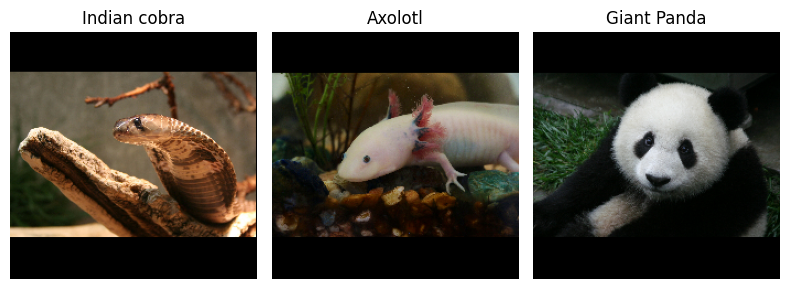

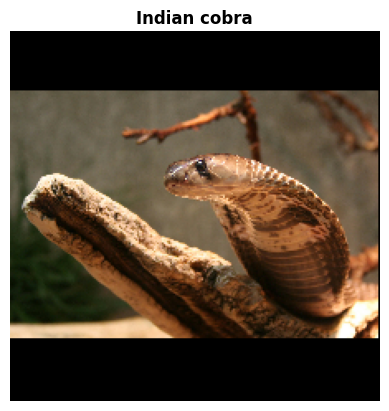

Indian cobra (concept index: 64): 91.7%
hognose snake (concept index: 55): 1.1%
green mamba (concept index: 65): 0.7%
horned viper (concept index: 67): 0.6%
night snake (concept index: 61): 0.5%


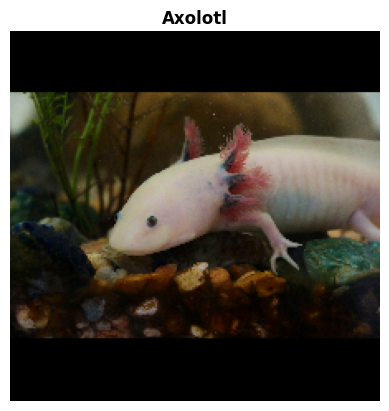

axolotl (concept index: 30): 94.2%
sulphur-crested cockatoo (concept index: 90): 0.0%
guinea pig (concept index: 339): 0.0%
spotted salamander (concept index: 29): 0.0%
borzoi (concept index: 170): 0.0%


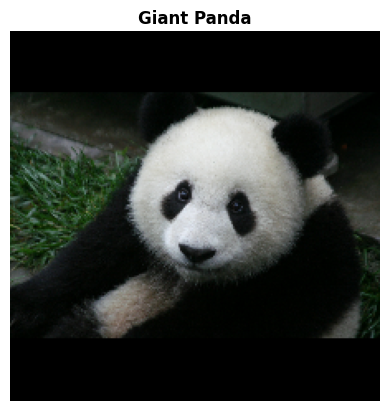

giant panda (concept index: 389): 93.6%
teddy (concept index: 851): 0.3%
lesser panda (concept index: 388): 0.2%
Siamese cat (concept index: 285): 0.1%
indri (concept index: 385): 0.1%


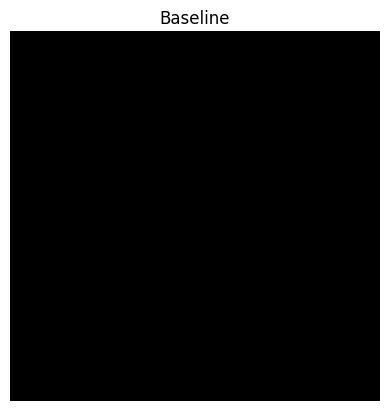

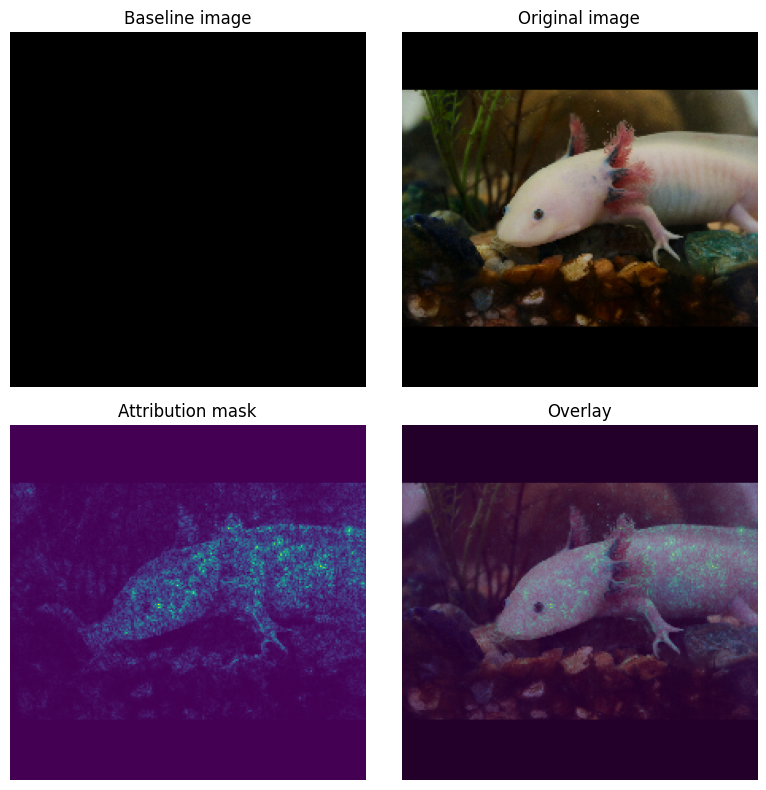

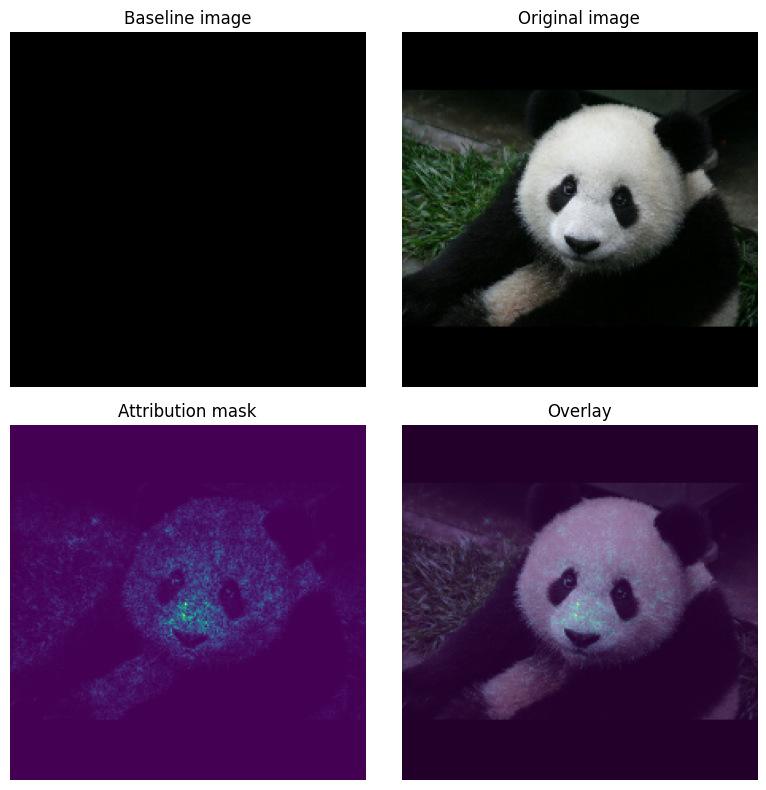

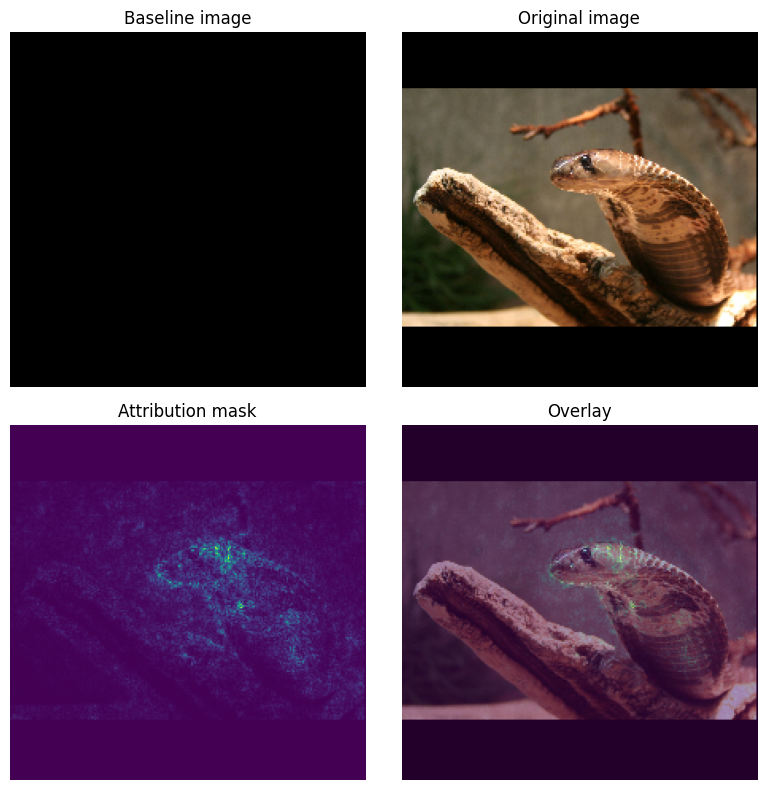

In [ ]:
#Download NN image classification model (any other (differential-learning) NN can be used instead)
model = tf.keras.Sequential([
  hub.KerasLayer(
  # name='inception_v1',
  # handle='https://tfhub.dev/google/imagenet/inception_v1/classification/4',
  name='inception_v2',
  handle='https://tfhub.dev/google/imagenet/inception_v2/classification/5',
  # name='inception_v3',
  # handle='https://tfhub.dev/google/imagenet/inception_v3/classification/5',
  # name='inception_resnet_v2',
  # handle='https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5',
  trainable=False),
])

model.build([None, 224, 224, 3])
model.summary()

#Import labels from Imagenet dataset
def load_imagenet_labels(file_path):
  labels_file = tf.keras.utils.get_file('ImageNetLabels.txt', file_path)
  with open(labels_file) as reader:
    f = reader.read()
    labels = f.splitlines()
  return np.array(labels)

imagenet_labels = load_imagenet_labels('https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')

#Import and visualize input images (any image can be used instead), assumed in jpg format
def read_image(file_name):
  image = tf.io.read_file(file_name)
  image = tf.io.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize_with_pad(image, target_height=224, target_width=224)
  return image

img_url = {'Indian cobra' : 'https://upload.wikimedia.org/wikipedia/commons/b/bd/Naja-naja-kobra-kopf.jpg' ,'Axolotl': 'https://upload.wikimedia.org/wikipedia/commons/1/15/Axolotl_ambystoma_mexicanum_anfibio_ASAG.jpg', 'Giant Panda': 'http://storage.googleapis.com/download.tensorflow.org/example_images/Giant_Panda_2.jpeg',}
img_paths = {name: tf.keras.utils.get_file(name, url) for (name, url) in img_url.items()}
img_name_tensors = {name: read_image(img_path) for (name, img_path) in img_paths.items()}
plt.figure(figsize=(8, 8))

for n, (name, img_tensors) in enumerate(img_name_tensors.items()):
  ax = plt.subplot(1, 3, n+1)
  ax.imshow(img_tensors)
  ax.set_title(name)
  ax.axis('off')
plt.tight_layout()
plt.show()

#Perform image classification (generate top-k most probable predictions)
def top_k_predictions(img, k=5):
  image_batch = tf.expand_dims(img, 0)
  predictions = model(image_batch)
  probs = tf.nn.softmax(predictions, axis=-1)
  top_probs, top_idxs = tf.math.top_k(input=probs, k=k)
  top_labels = imagenet_labels[tuple(top_idxs)]
  return top_labels, top_probs[0], top_idxs[0]

#Visualize classification results
for (name, img_tensor) in img_name_tensors.items():
  plt.imshow(img_tensor)
  plt.title(name, fontweight='bold')
  plt.axis('off')
  plt.show()
  pred_label, pred_prob, pred_idx = top_k_predictions(img_tensor)
  for label, prob, idx in zip(pred_label, pred_prob, pred_idx):
    print(f'{label} (concept index: {idx}): {prob:0.1%}')

#Apply 'Integrated Gradients' XAI method
#Define baseline image for explanations generation
baseline = tf.zeros(shape=(224,224,3))
#baseline = tf.ones(shape=(224,224,3))
#baseline = tf.random.uniform(shape=(224,224,3), minval=0.0, maxval=1.0)
plt.imshow(baseline)
plt.title("Baseline")
plt.axis('off')
plt.show()

#Interpolation between baseline and original image
m_steps=50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1) # Generate m_steps intervals for integral_approximation()
def interpolate_images(baseline, image, alphas):
  alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
  baseline_x = tf.expand_dims(baseline, axis=0)
  input_x = tf.expand_dims(image, axis=0)
  delta = input_x - baseline_x
  images = baseline_x + alphas_x * delta
  return images

#Calculation of gradients
def compute_gradients(images, target_class_idx):
  with tf.GradientTape() as tape:
    tape.watch(images)
    logits = model(images)
    probs = tf.nn.softmax(logits, axis=-1)[:, target_class_idx]
  return tape.gradient(probs, images)

#Integral approximation of gradient accumulation
def integral_approximation(gradients):
  # riemann_trapezoidal
  grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
  integrated_gradients = tf.math.reduce_mean(grads, axis=0)
  return integrated_gradients

#Execution of actual 'Integrated Gradients' method
def integrated_gradients(baseline, image, target_class_idx, m_steps=50, batch_size=32):
  # Generate alphas.
  alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)
  # Collect gradients.
  gradient_batches = []
  # Iterate alphas range and batch computation for speed, memory efficiency, and scaling to larger m_steps.
  for alpha in tf.range(0, len(alphas), batch_size):
    from_ = alpha
    to = tf.minimum(from_ + batch_size, len(alphas))
    alpha_batch = alphas[from_:to]
    gradient_batch = one_batch(baseline, image, alpha_batch, target_class_idx)
    gradient_batches.append(gradient_batch)
  # Concatenate path gradients together row-wise into single tensor.
  total_gradients = tf.concat(gradient_batches, axis=0)
  # Integral approximation through averaging gradients.
  avg_gradients = integral_approximation(gradients=total_gradients)
  # Scale integrated gradients with respect to input.
  integrated_gradients = (image - baseline) * avg_gradients
  return integrated_gradients

#Optimized processing pipeline
@tf.function
def one_batch(baseline, image, alpha_batch, target_class_idx):
  # Generate interpolated inputs between baseline and input.
  interpolated_path_input_batch = interpolate_images(baseline=baseline, image=image, alphas=alpha_batch)
  # Compute gradients between model outputs and interpolated inputs.
  gradient_batch = compute_gradients(images=interpolated_path_input_batch,
  target_class_idx=target_class_idx)
  return gradient_batch

#Visualize Integrated Gradients output
def plot_img_attributions(baseline, image, target_class_idx, m_steps=50, cmap=None, overlay_alpha=0.4):
  attributions = integrated_gradients(baseline=baseline, image=image, target_class_idx=target_class_idx, m_steps=m_steps)
  # Sum of the attributions across color channels for visualization.
  # The attribution mask shape is a grayscale image with height and width
  # equal to the original image.
  attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)
  fig, axs = plt.subplots(nrows=2, ncols=2, squeeze=False, figsize=(8, 8))
  axs[0, 0].set_title('Baseline image')
  axs[0, 0].imshow(baseline)
  axs[0, 0].axis('off')
  axs[0, 1].set_title('Original image')
  axs[0, 1].imshow(image)
  axs[0, 1].axis('off')
  axs[1, 0].set_title('Attribution mask')
  axs[1, 0].imshow(attribution_mask, cmap=cmap)
  axs[1, 0].axis('off')
  axs[1, 1].set_title('Overlay')
  axs[1, 1].imshow(attribution_mask, cmap=cmap)
  axs[1, 1].imshow(image, alpha=overlay_alpha)
  axs[1, 1].axis('off')
  plt.tight_layout()
  return fig

_ = plot_img_attributions(image=img_name_tensors['Axolotl'], baseline=baseline, target_class_idx=30, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Giant Panda'], baseline=baseline, target_class_idx=389, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Indian cobra'], baseline=baseline, target_class_idx=64, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)



Όσο αφορά το Inception_v2 το νευρωνικό δίκτυο εκφράζει αρκετά μεγαλύτερη βεβαιότητα όσον αφορά την αναγνώριση των εικόνων σε σχέση με το inception_v1. Η κόμπρα αναγνωρίζεται με ποσοστό επιτυχίας 91.7%, που είναι πολύ καλύτερο απο το inception_v1, ενώ όσον αφορά το panda, το δίκτυο είναι και πάλι αρκετά βέβαιο με ποσοστό επιτυχίας 93.6%. Αντίθετα όμως για το axolotl, δεν αναγνωρίζεται όπως το inception_v1 (100%) και η πρόβλεψη έπεσε στο 94.2%.

#### Inception v3

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (KerasLayer)   (None, 1001)              23853833  
                                                                 
Total params: 23853833 (91.00 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 23853833 (91.00 MB)
_________________________________________________________________


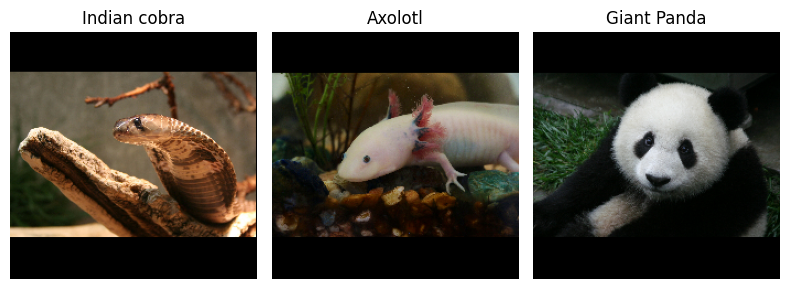

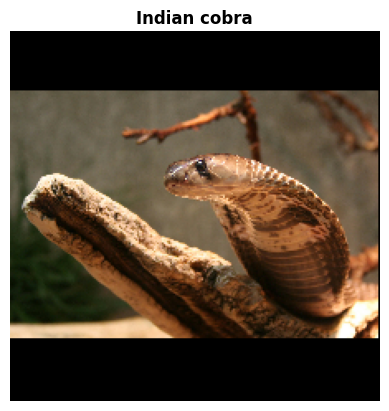

Indian cobra (concept index: 64): 99.6%
boa constrictor (concept index: 62): 0.1%
sea snake (concept index: 66): 0.1%
horned viper (concept index: 67): 0.0%
rock python (concept index: 63): 0.0%


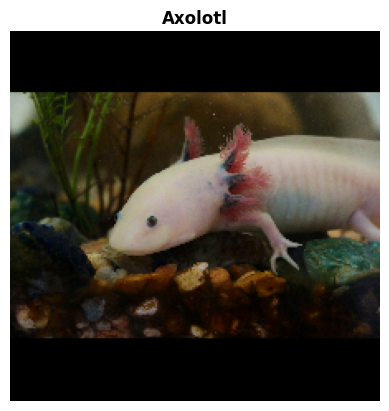

axolotl (concept index: 30): 100.0%
dumbbell (concept index: 544): 0.0%
sulphur-crested cockatoo (concept index: 90): 0.0%
barbell (concept index: 423): 0.0%
spotted salamander (concept index: 29): 0.0%


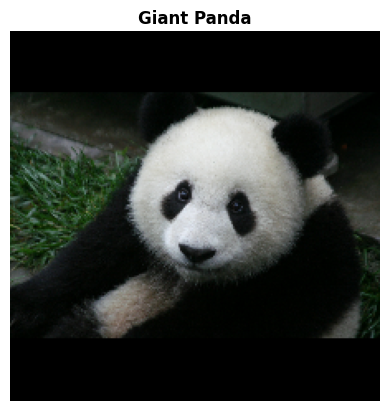

giant panda (concept index: 389): 100.0%
space shuttle (concept index: 813): 0.0%
teddy (concept index: 851): 0.0%
lesser panda (concept index: 388): 0.0%
earthstar (concept index: 996): 0.0%


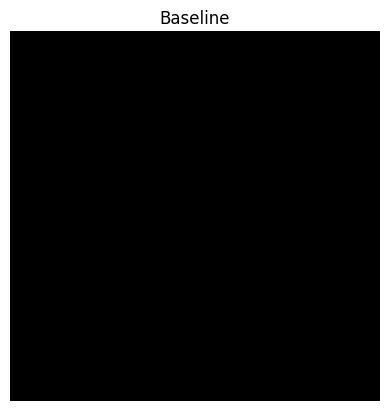

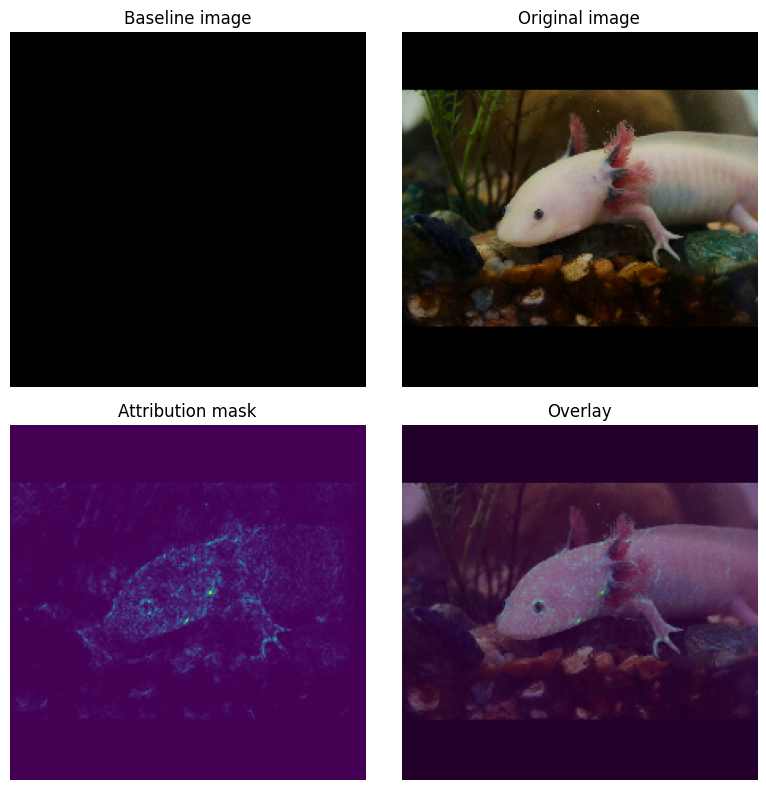

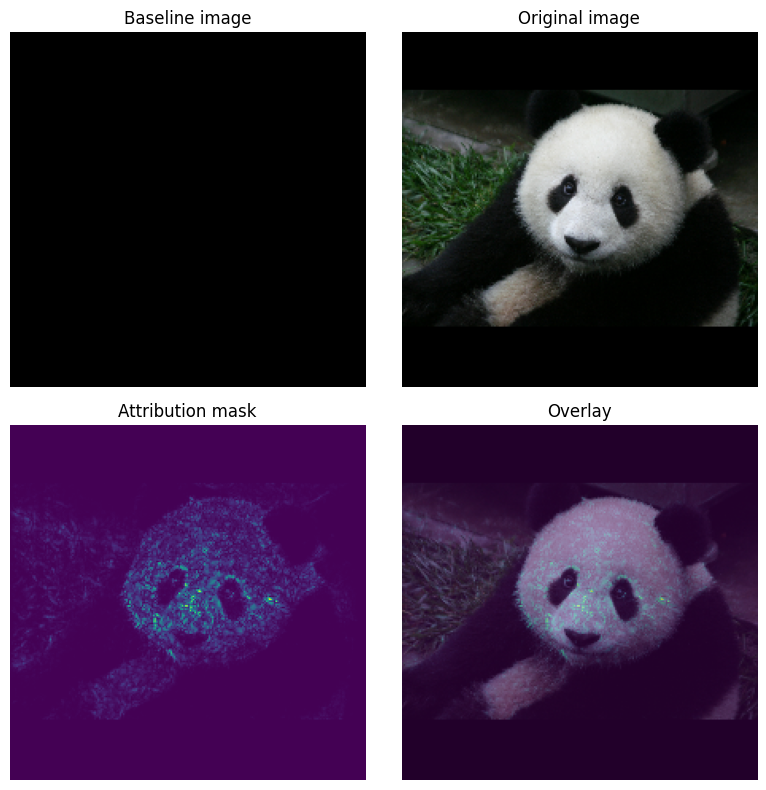

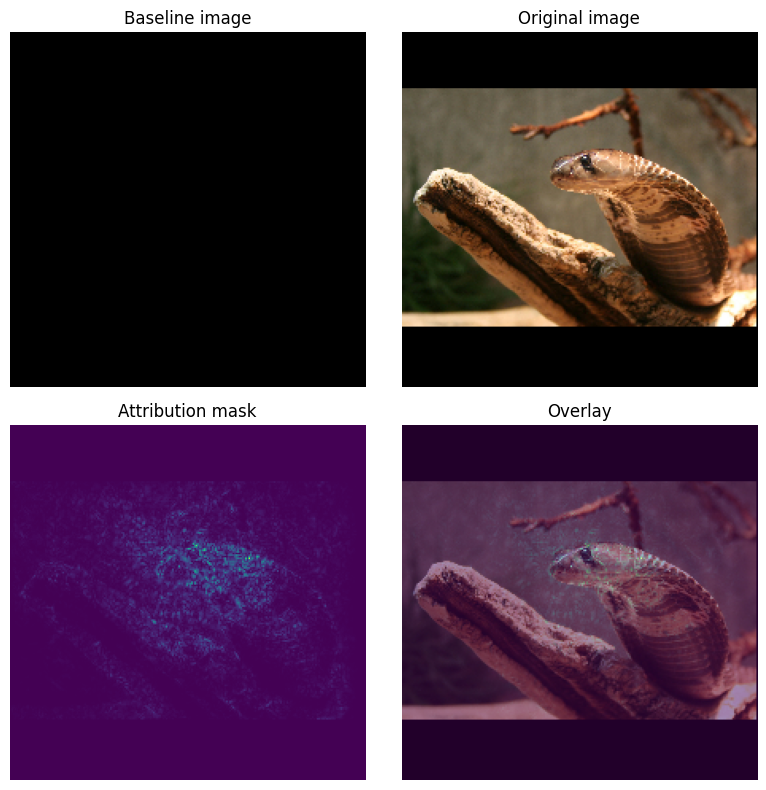

In [ ]:
#Download NN image classification model (any other (differential-learning) NN can be used instead)
model = tf.keras.Sequential([
  hub.KerasLayer(
  # name='inception_v1',
  # handle='https://tfhub.dev/google/imagenet/inception_v1/classification/4',
  # name='inception_v2',
  # handle='https://tfhub.dev/google/imagenet/inception_v2/classification/5',
  name='inception_v3',
  handle='https://tfhub.dev/google/imagenet/inception_v3/classification/5',
  # name='inception_resnet_v2',
  # handle='https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5',
  trainable=False),
])

model.build([None, 224, 224, 3])
model.summary()

#Import labels from Imagenet dataset
def load_imagenet_labels(file_path):
  labels_file = tf.keras.utils.get_file('ImageNetLabels.txt', file_path)
  with open(labels_file) as reader:
    f = reader.read()
    labels = f.splitlines()
  return np.array(labels)

imagenet_labels = load_imagenet_labels('https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')

#Import and visualize input images (any image can be used instead), assumed in jpg format
def read_image(file_name):
  image = tf.io.read_file(file_name)
  image = tf.io.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize_with_pad(image, target_height=224, target_width=224)
  return image

img_url = {'Indian cobra' : 'https://upload.wikimedia.org/wikipedia/commons/b/bd/Naja-naja-kobra-kopf.jpg' ,'Axolotl': 'https://upload.wikimedia.org/wikipedia/commons/1/15/Axolotl_ambystoma_mexicanum_anfibio_ASAG.jpg', 'Giant Panda': 'http://storage.googleapis.com/download.tensorflow.org/example_images/Giant_Panda_2.jpeg',}
img_paths = {name: tf.keras.utils.get_file(name, url) for (name, url) in img_url.items()}
img_name_tensors = {name: read_image(img_path) for (name, img_path) in img_paths.items()}
plt.figure(figsize=(8, 8))

for n, (name, img_tensors) in enumerate(img_name_tensors.items()):
  ax = plt.subplot(1, 3, n+1)
  ax.imshow(img_tensors)
  ax.set_title(name)
  ax.axis('off')
plt.tight_layout()
plt.show()

#Perform image classification (generate top-k most probable predictions)
def top_k_predictions(img, k=5):
  image_batch = tf.expand_dims(img, 0)
  predictions = model(image_batch)
  probs = tf.nn.softmax(predictions, axis=-1)
  top_probs, top_idxs = tf.math.top_k(input=probs, k=k)
  top_labels = imagenet_labels[tuple(top_idxs)]
  return top_labels, top_probs[0], top_idxs[0]

#Visualize classification results
for (name, img_tensor) in img_name_tensors.items():
  plt.imshow(img_tensor)
  plt.title(name, fontweight='bold')
  plt.axis('off')
  plt.show()
  pred_label, pred_prob, pred_idx = top_k_predictions(img_tensor)
  for label, prob, idx in zip(pred_label, pred_prob, pred_idx):
    print(f'{label} (concept index: {idx}): {prob:0.1%}')

#Apply 'Integrated Gradients' XAI method
#Define baseline image for explanations generation
baseline = tf.zeros(shape=(224,224,3))
#baseline = tf.ones(shape=(224,224,3))
#baseline = tf.random.uniform(shape=(224,224,3), minval=0.0, maxval=1.0)
plt.imshow(baseline)
plt.title("Baseline")
plt.axis('off')
plt.show()

#Interpolation between baseline and original image
m_steps=50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1) # Generate m_steps intervals for integral_approximation()
def interpolate_images(baseline, image, alphas):
  alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
  baseline_x = tf.expand_dims(baseline, axis=0)
  input_x = tf.expand_dims(image, axis=0)
  delta = input_x - baseline_x
  images = baseline_x + alphas_x * delta
  return images

#Calculation of gradients
def compute_gradients(images, target_class_idx):
  with tf.GradientTape() as tape:
    tape.watch(images)
    logits = model(images)
    probs = tf.nn.softmax(logits, axis=-1)[:, target_class_idx]
  return tape.gradient(probs, images)

#Integral approximation of gradient accumulation
def integral_approximation(gradients):
  # riemann_trapezoidal
  grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
  integrated_gradients = tf.math.reduce_mean(grads, axis=0)
  return integrated_gradients

#Execution of actual 'Integrated Gradients' method
def integrated_gradients(baseline, image, target_class_idx, m_steps=50, batch_size=32):
  # Generate alphas.
  alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)
  # Collect gradients.
  gradient_batches = []
  # Iterate alphas range and batch computation for speed, memory efficiency, and scaling to larger m_steps.
  for alpha in tf.range(0, len(alphas), batch_size):
    from_ = alpha
    to = tf.minimum(from_ + batch_size, len(alphas))
    alpha_batch = alphas[from_:to]
    gradient_batch = one_batch(baseline, image, alpha_batch, target_class_idx)
    gradient_batches.append(gradient_batch)
  # Concatenate path gradients together row-wise into single tensor.
  total_gradients = tf.concat(gradient_batches, axis=0)
  # Integral approximation through averaging gradients.
  avg_gradients = integral_approximation(gradients=total_gradients)
  # Scale integrated gradients with respect to input.
  integrated_gradients = (image - baseline) * avg_gradients
  return integrated_gradients

#Optimized processing pipeline
@tf.function
def one_batch(baseline, image, alpha_batch, target_class_idx):
  # Generate interpolated inputs between baseline and input.
  interpolated_path_input_batch = interpolate_images(baseline=baseline, image=image, alphas=alpha_batch)
  # Compute gradients between model outputs and interpolated inputs.
  gradient_batch = compute_gradients(images=interpolated_path_input_batch,
  target_class_idx=target_class_idx)
  return gradient_batch

#Visualize Integrated Gradients output
def plot_img_attributions(baseline, image, target_class_idx, m_steps=50, cmap=None, overlay_alpha=0.4):
  attributions = integrated_gradients(baseline=baseline, image=image, target_class_idx=target_class_idx, m_steps=m_steps)
  # Sum of the attributions across color channels for visualization.
  # The attribution mask shape is a grayscale image with height and width
  # equal to the original image.
  attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)
  fig, axs = plt.subplots(nrows=2, ncols=2, squeeze=False, figsize=(8, 8))
  axs[0, 0].set_title('Baseline image')
  axs[0, 0].imshow(baseline)
  axs[0, 0].axis('off')
  axs[0, 1].set_title('Original image')
  axs[0, 1].imshow(image)
  axs[0, 1].axis('off')
  axs[1, 0].set_title('Attribution mask')
  axs[1, 0].imshow(attribution_mask, cmap=cmap)
  axs[1, 0].axis('off')
  axs[1, 1].set_title('Overlay')
  axs[1, 1].imshow(attribution_mask, cmap=cmap)
  axs[1, 1].imshow(image, alpha=overlay_alpha)
  axs[1, 1].axis('off')
  plt.tight_layout()
  return fig

_ = plot_img_attributions(image=img_name_tensors['Axolotl'], baseline=baseline, target_class_idx=30, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Giant Panda'], baseline=baseline, target_class_idx=389, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Indian cobra'], baseline=baseline, target_class_idx=64, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)



Στο Inception_v3 παρατηρούμε μια σημαντική αύξηση της βεβαιότητας σε σχέση με τα υπόλοιπα 2 versions. Αρχικά αναγνωρίζει σχεδόν άριστα την κόμπρα με 99.6% (πολύ καλύτερο σε σχέση με τα προηγούμενα) ενώ το axolotl και το panda με 100% επιτυχία.

#### Inception resnet v2

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Keras  (None, 1001)              55875273  
 Layer)                                                          
                                                                 
Total params: 55875273 (213.15 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 55875273 (213.15 MB)
_________________________________________________________________


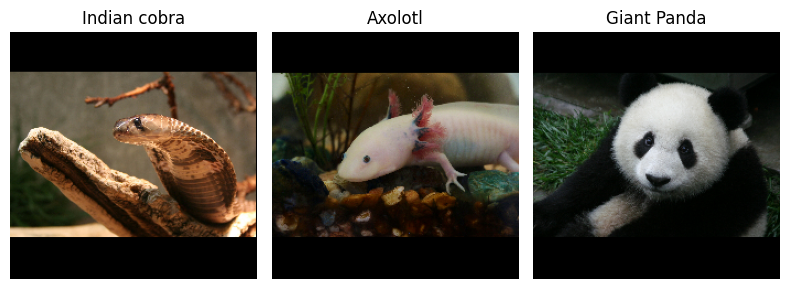

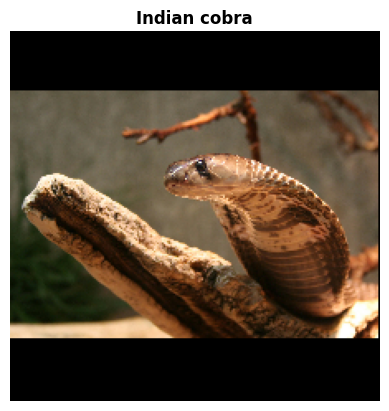

Indian cobra (concept index: 64): 100.0%
horned viper (concept index: 67): 0.0%
green mamba (concept index: 65): 0.0%
night snake (concept index: 61): 0.0%
hognose snake (concept index: 55): 0.0%


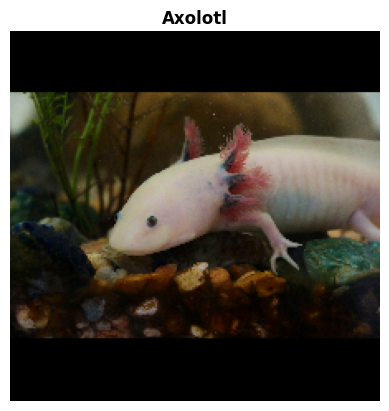

axolotl (concept index: 30): 100.0%
common newt (concept index: 27): 0.0%
spotted salamander (concept index: 29): 0.0%
hyena (concept index: 277): 0.0%
goldfish (concept index: 2): 0.0%


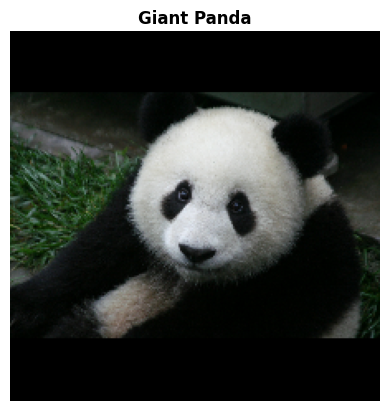

giant panda (concept index: 389): 100.0%
lesser panda (concept index: 388): 0.0%
bullet train (concept index: 467): 0.0%
teddy (concept index: 851): 0.0%
soccer ball (concept index: 806): 0.0%


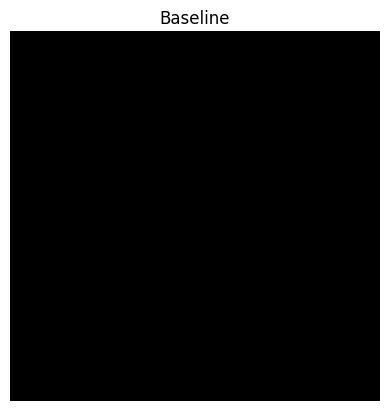

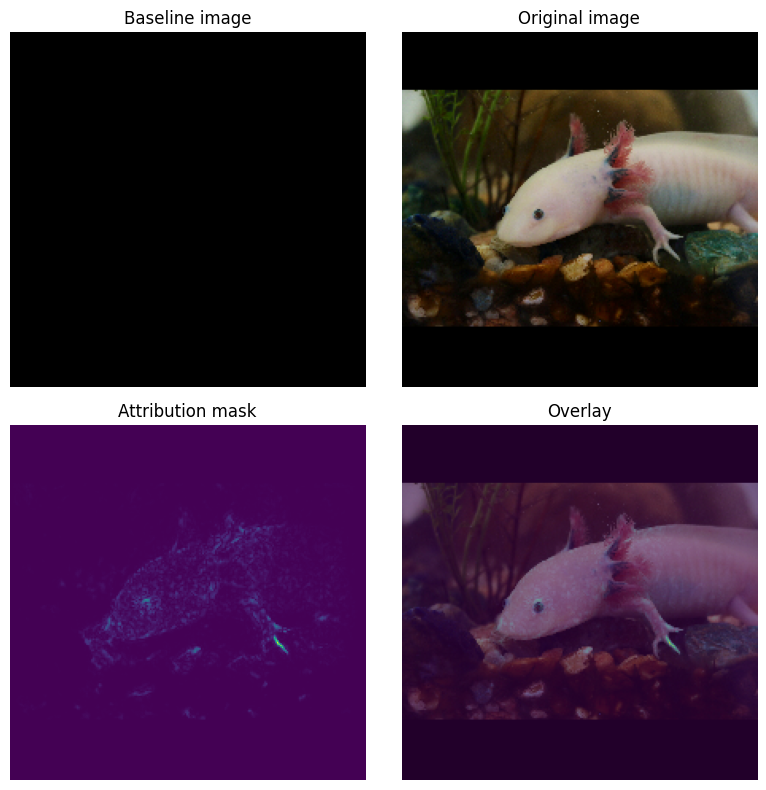

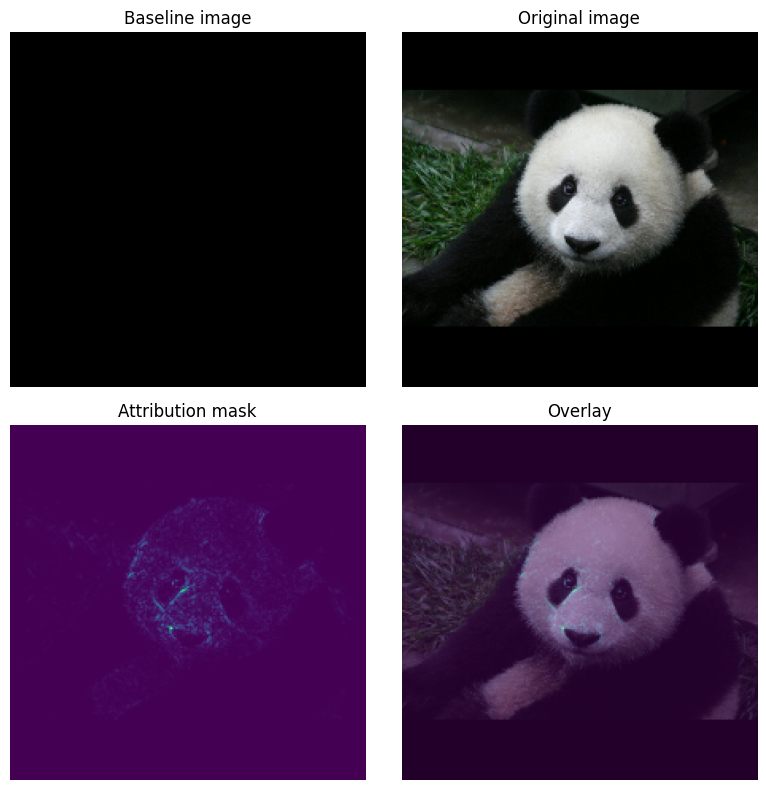

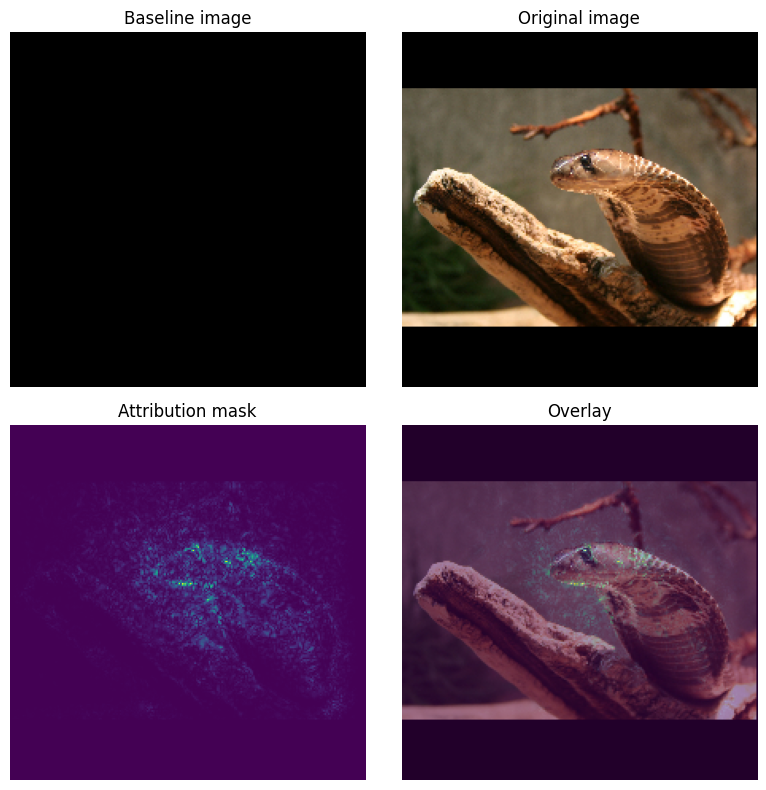

In [ ]:
#Download NN image classification model (any other (differential-learning) NN can be used instead)
model = tf.keras.Sequential([
  hub.KerasLayer(
  # name='inception_v1',
  # handle='https://tfhub.dev/google/imagenet/inception_v1/classification/4',
  # name='inception_v2',
  # handle='https://tfhub.dev/google/imagenet/inception_v2/classification/5',
  # name='inception_v3',
  # handle='https://tfhub.dev/google/imagenet/inception_v3/classification/5',
  name='inception_resnet_v2',
  handle='https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5',
  trainable=False),
])

model.build([None, 224, 224, 3])
model.summary()

#Import labels from Imagenet dataset
def load_imagenet_labels(file_path):
  labels_file = tf.keras.utils.get_file('ImageNetLabels.txt', file_path)
  with open(labels_file) as reader:
    f = reader.read()
    labels = f.splitlines()
  return np.array(labels)

imagenet_labels = load_imagenet_labels('https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')

#Import and visualize input images (any image can be used instead), assumed in jpg format
def read_image(file_name):
  image = tf.io.read_file(file_name)
  image = tf.io.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize_with_pad(image, target_height=224, target_width=224)
  return image

img_url = {'Indian cobra' : 'https://upload.wikimedia.org/wikipedia/commons/b/bd/Naja-naja-kobra-kopf.jpg' ,'Axolotl': 'https://upload.wikimedia.org/wikipedia/commons/1/15/Axolotl_ambystoma_mexicanum_anfibio_ASAG.jpg', 'Giant Panda': 'http://storage.googleapis.com/download.tensorflow.org/example_images/Giant_Panda_2.jpeg',}
img_paths = {name: tf.keras.utils.get_file(name, url) for (name, url) in img_url.items()}
img_name_tensors = {name: read_image(img_path) for (name, img_path) in img_paths.items()}
plt.figure(figsize=(8, 8))

for n, (name, img_tensors) in enumerate(img_name_tensors.items()):
  ax = plt.subplot(1, 3, n+1)
  ax.imshow(img_tensors)
  ax.set_title(name)
  ax.axis('off')
plt.tight_layout()
plt.show()

#Perform image classification (generate top-k most probable predictions)
def top_k_predictions(img, k=5):
  image_batch = tf.expand_dims(img, 0)
  predictions = model(image_batch)
  probs = tf.nn.softmax(predictions, axis=-1)
  top_probs, top_idxs = tf.math.top_k(input=probs, k=k)
  top_labels = imagenet_labels[tuple(top_idxs)]
  return top_labels, top_probs[0], top_idxs[0]

#Visualize classification results
for (name, img_tensor) in img_name_tensors.items():
  plt.imshow(img_tensor)
  plt.title(name, fontweight='bold')
  plt.axis('off')
  plt.show()
  pred_label, pred_prob, pred_idx = top_k_predictions(img_tensor)
  for label, prob, idx in zip(pred_label, pred_prob, pred_idx):
    print(f'{label} (concept index: {idx}): {prob:0.1%}')

#Apply 'Integrated Gradients' XAI method
#Define baseline image for explanations generation
baseline = tf.zeros(shape=(224,224,3))
#baseline = tf.ones(shape=(224,224,3))
#baseline = tf.random.uniform(shape=(224,224,3), minval=0.0, maxval=1.0)
plt.imshow(baseline)
plt.title("Baseline")
plt.axis('off')
plt.show()

#Interpolation between baseline and original image
m_steps=50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1) # Generate m_steps intervals for integral_approximation()
def interpolate_images(baseline, image, alphas):
  alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
  baseline_x = tf.expand_dims(baseline, axis=0)
  input_x = tf.expand_dims(image, axis=0)
  delta = input_x - baseline_x
  images = baseline_x + alphas_x * delta
  return images

#Calculation of gradients
def compute_gradients(images, target_class_idx):
  with tf.GradientTape() as tape:
    tape.watch(images)
    logits = model(images)
    probs = tf.nn.softmax(logits, axis=-1)[:, target_class_idx]
  return tape.gradient(probs, images)

#Integral approximation of gradient accumulation
def integral_approximation(gradients):
  # riemann_trapezoidal
  grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
  integrated_gradients = tf.math.reduce_mean(grads, axis=0)
  return integrated_gradients

#Execution of actual 'Integrated Gradients' method
def integrated_gradients(baseline, image, target_class_idx, m_steps=50, batch_size=32):
  # Generate alphas.
  alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)
  # Collect gradients.
  gradient_batches = []
  # Iterate alphas range and batch computation for speed, memory efficiency, and scaling to larger m_steps.
  for alpha in tf.range(0, len(alphas), batch_size):
    from_ = alpha
    to = tf.minimum(from_ + batch_size, len(alphas))
    alpha_batch = alphas[from_:to]
    gradient_batch = one_batch(baseline, image, alpha_batch, target_class_idx)
    gradient_batches.append(gradient_batch)
  # Concatenate path gradients together row-wise into single tensor.
  total_gradients = tf.concat(gradient_batches, axis=0)
  # Integral approximation through averaging gradients.
  avg_gradients = integral_approximation(gradients=total_gradients)
  # Scale integrated gradients with respect to input.
  integrated_gradients = (image - baseline) * avg_gradients
  return integrated_gradients

#Optimized processing pipeline
@tf.function
def one_batch(baseline, image, alpha_batch, target_class_idx):
  # Generate interpolated inputs between baseline and input.
  interpolated_path_input_batch = interpolate_images(baseline=baseline, image=image, alphas=alpha_batch)
  # Compute gradients between model outputs and interpolated inputs.
  gradient_batch = compute_gradients(images=interpolated_path_input_batch,
  target_class_idx=target_class_idx)
  return gradient_batch

#Visualize Integrated Gradients output
def plot_img_attributions(baseline, image, target_class_idx, m_steps=50, cmap=None, overlay_alpha=0.4):
  attributions = integrated_gradients(baseline=baseline, image=image, target_class_idx=target_class_idx, m_steps=m_steps)
  # Sum of the attributions across color channels for visualization.
  # The attribution mask shape is a grayscale image with height and width
  # equal to the original image.
  attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)
  fig, axs = plt.subplots(nrows=2, ncols=2, squeeze=False, figsize=(8, 8))
  axs[0, 0].set_title('Baseline image')
  axs[0, 0].imshow(baseline)
  axs[0, 0].axis('off')
  axs[0, 1].set_title('Original image')
  axs[0, 1].imshow(image)
  axs[0, 1].axis('off')
  axs[1, 0].set_title('Attribution mask')
  axs[1, 0].imshow(attribution_mask, cmap=cmap)
  axs[1, 0].axis('off')
  axs[1, 1].set_title('Overlay')
  axs[1, 1].imshow(attribution_mask, cmap=cmap)
  axs[1, 1].imshow(image, alpha=overlay_alpha)
  axs[1, 1].axis('off')
  plt.tight_layout()
  return fig

_ = plot_img_attributions(image=img_name_tensors['Axolotl'], baseline=baseline, target_class_idx=30, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Giant Panda'], baseline=baseline, target_class_idx=389, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Indian cobra'], baseline=baseline, target_class_idx=64, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)



Στην έκδοση Inception_resnet_v2, παρατηρούμε τα υψηλότερα ποσοστά επιτυχίας μέχρι στιγμής, καθώς όλα τα ζώα αναγνωρίζονται σωστά με ποσοστό "σιγουρίας" 100%.

### Ζητούμενο Β:

Παρατηρούμε ότι το καλύτερο αποτέλεσμα (classification) για κάθε εικόνα το έχει το inception_resnet_v2, οπότε και το επιλέγουμε. Ακολουθεί η δοκιμή με baseline random:

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Keras  (None, 1001)              55875273  
 Layer)                                                          
                                                                 
Total params: 55875273 (213.15 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 55875273 (213.15 MB)
_________________________________________________________________


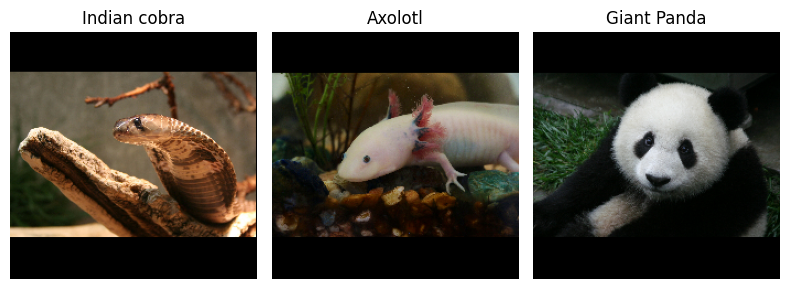

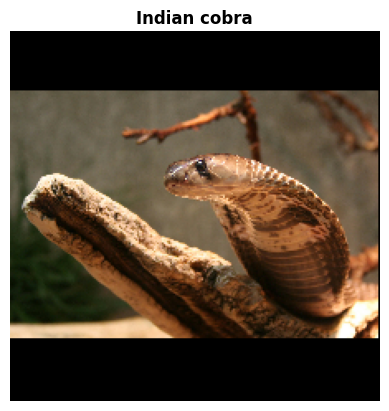

Indian cobra (concept index: 64): 100.0%
horned viper (concept index: 67): 0.0%
green mamba (concept index: 65): 0.0%
night snake (concept index: 61): 0.0%
hognose snake (concept index: 55): 0.0%


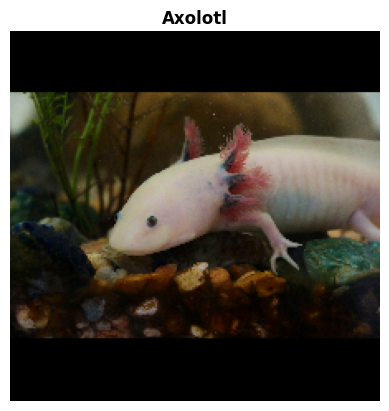

axolotl (concept index: 30): 100.0%
common newt (concept index: 27): 0.0%
spotted salamander (concept index: 29): 0.0%
hyena (concept index: 277): 0.0%
goldfish (concept index: 2): 0.0%


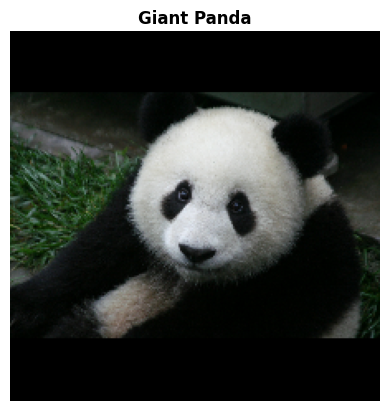

giant panda (concept index: 389): 100.0%
lesser panda (concept index: 388): 0.0%
bullet train (concept index: 467): 0.0%
teddy (concept index: 851): 0.0%
soccer ball (concept index: 806): 0.0%


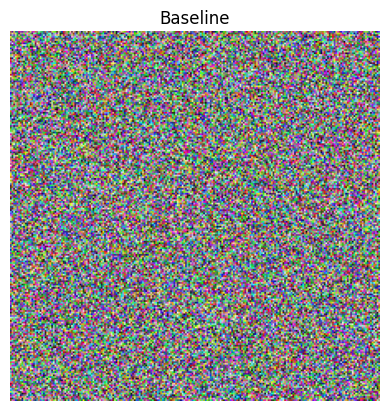

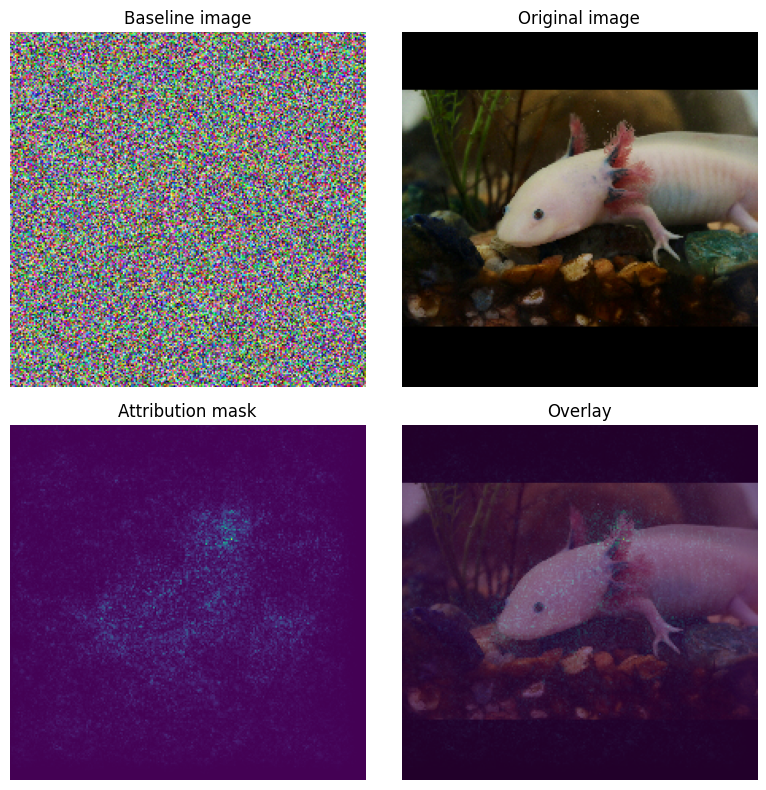

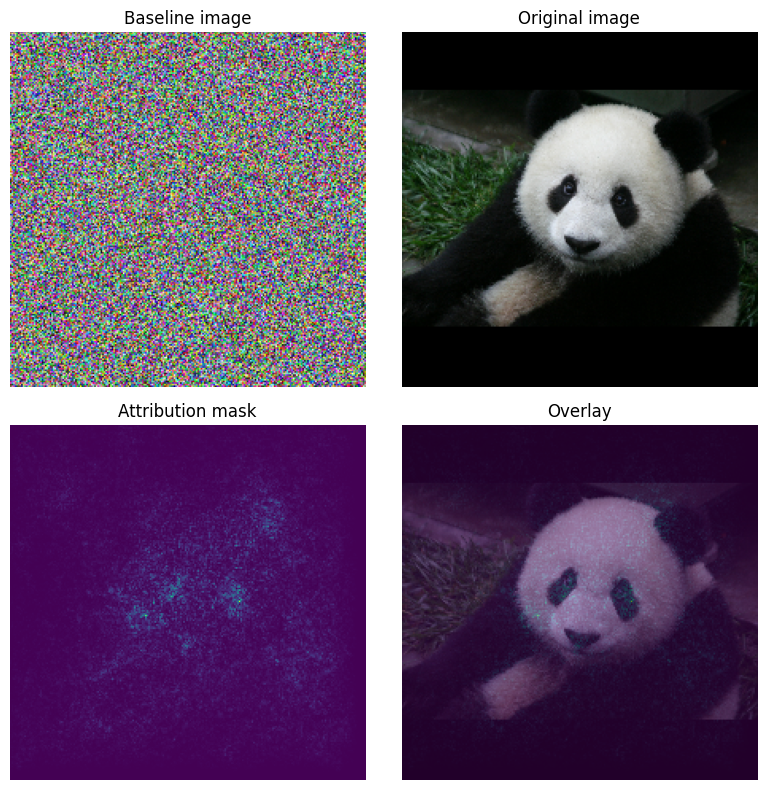

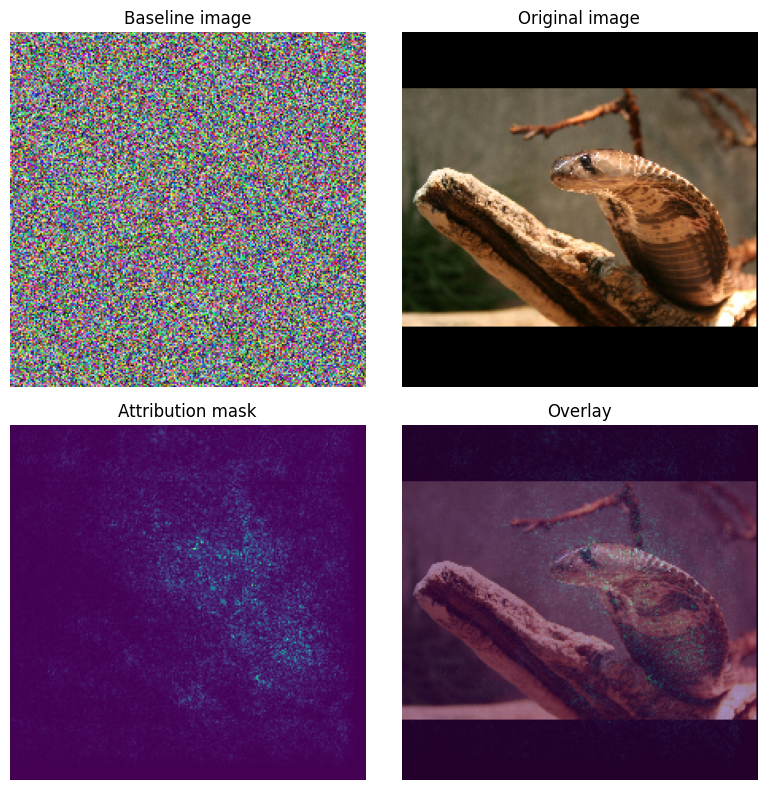

In [ ]:
#Download NN image classification model (any other (differential-learning) NN can be used instead)
model = tf.keras.Sequential([
  hub.KerasLayer(
  # name='inception_v1',
  # handle='https://tfhub.dev/google/imagenet/inception_v1/classification/4',
  # name='inception_v2',
  # handle='https://tfhub.dev/google/imagenet/inception_v2/classification/5',
  # name='inception_v3',
  # handle='https://tfhub.dev/google/imagenet/inception_v3/classification/5',
  name='inception_resnet_v2',
  handle='https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5',
  trainable=False),
])

model.build([None, 224, 224, 3])
model.summary()

#Import labels from Imagenet dataset
def load_imagenet_labels(file_path):
  labels_file = tf.keras.utils.get_file('ImageNetLabels.txt', file_path)
  with open(labels_file) as reader:
    f = reader.read()
    labels = f.splitlines()
  return np.array(labels)

imagenet_labels = load_imagenet_labels('https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')

#Import and visualize input images (any image can be used instead), assumed in jpg format
def read_image(file_name):
  image = tf.io.read_file(file_name)
  image = tf.io.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize_with_pad(image, target_height=224, target_width=224)
  return image

img_url = {'Indian cobra' : 'https://upload.wikimedia.org/wikipedia/commons/b/bd/Naja-naja-kobra-kopf.jpg' ,'Axolotl': 'https://upload.wikimedia.org/wikipedia/commons/1/15/Axolotl_ambystoma_mexicanum_anfibio_ASAG.jpg', 'Giant Panda': 'http://storage.googleapis.com/download.tensorflow.org/example_images/Giant_Panda_2.jpeg',}
img_paths = {name: tf.keras.utils.get_file(name, url) for (name, url) in img_url.items()}
img_name_tensors = {name: read_image(img_path) for (name, img_path) in img_paths.items()}
plt.figure(figsize=(8, 8))

for n, (name, img_tensors) in enumerate(img_name_tensors.items()):
  ax = plt.subplot(1, 3, n+1)
  ax.imshow(img_tensors)
  ax.set_title(name)
  ax.axis('off')
plt.tight_layout()
plt.show()

#Perform image classification (generate top-k most probable predictions)
def top_k_predictions(img, k=5):
  image_batch = tf.expand_dims(img, 0)
  predictions = model(image_batch)
  probs = tf.nn.softmax(predictions, axis=-1)
  top_probs, top_idxs = tf.math.top_k(input=probs, k=k)
  top_labels = imagenet_labels[tuple(top_idxs)]
  return top_labels, top_probs[0], top_idxs[0]

#Visualize classification results
for (name, img_tensor) in img_name_tensors.items():
  plt.imshow(img_tensor)
  plt.title(name, fontweight='bold')
  plt.axis('off')
  plt.show()
  pred_label, pred_prob, pred_idx = top_k_predictions(img_tensor)
  for label, prob, idx in zip(pred_label, pred_prob, pred_idx):
    print(f'{label} (concept index: {idx}): {prob:0.1%}')

#Apply 'Integrated Gradients' XAI method
#Define baseline image for explanations generation
#baseline = tf.zeros(shape=(224,224,3))
#baseline = tf.ones(shape=(224,224,3))
tf.random.set_seed(42)
baseline = tf.random.uniform(shape=(224,224,3), minval=0.0, maxval=1.0)
plt.imshow(baseline)
plt.title("Baseline")
plt.axis('off')
plt.show()

#Interpolation between baseline and original image
m_steps=50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1) # Generate m_steps intervals for integral_approximation()
def interpolate_images(baseline, image, alphas):
  alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
  baseline_x = tf.expand_dims(baseline, axis=0)
  input_x = tf.expand_dims(image, axis=0)
  delta = input_x - baseline_x
  images = baseline_x + alphas_x * delta
  return images

#Calculation of gradients
def compute_gradients(images, target_class_idx):
  with tf.GradientTape() as tape:
    tape.watch(images)
    logits = model(images)
    probs = tf.nn.softmax(logits, axis=-1)[:, target_class_idx]
  return tape.gradient(probs, images)

#Integral approximation of gradient accumulation
def integral_approximation(gradients):
  # riemann_trapezoidal
  grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
  integrated_gradients = tf.math.reduce_mean(grads, axis=0)
  return integrated_gradients

#Execution of actual 'Integrated Gradients' method
def integrated_gradients(baseline, image, target_class_idx, m_steps=50, batch_size=32):
  # Generate alphas.
  alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)
  # Collect gradients.
  gradient_batches = []
  # Iterate alphas range and batch computation for speed, memory efficiency, and scaling to larger m_steps.
  for alpha in tf.range(0, len(alphas), batch_size):
    from_ = alpha
    to = tf.minimum(from_ + batch_size, len(alphas))
    alpha_batch = alphas[from_:to]
    gradient_batch = one_batch(baseline, image, alpha_batch, target_class_idx)
    gradient_batches.append(gradient_batch)
  # Concatenate path gradients together row-wise into single tensor.
  total_gradients = tf.concat(gradient_batches, axis=0)
  # Integral approximation through averaging gradients.
  avg_gradients = integral_approximation(gradients=total_gradients)
  # Scale integrated gradients with respect to input.
  integrated_gradients = (image - baseline) * avg_gradients
  return integrated_gradients

#Optimized processing pipeline
@tf.function
def one_batch(baseline, image, alpha_batch, target_class_idx):
  # Generate interpolated inputs between baseline and input.
  interpolated_path_input_batch = interpolate_images(baseline=baseline, image=image, alphas=alpha_batch)
  # Compute gradients between model outputs and interpolated inputs.
  gradient_batch = compute_gradients(images=interpolated_path_input_batch,
  target_class_idx=target_class_idx)
  return gradient_batch

#Visualize Integrated Gradients output
def plot_img_attributions(baseline, image, target_class_idx, m_steps=50, cmap=None, overlay_alpha=0.4):
  attributions = integrated_gradients(baseline=baseline, image=image, target_class_idx=target_class_idx, m_steps=m_steps)
  # Sum of the attributions across color channels for visualization.
  # The attribution mask shape is a grayscale image with height and width
  # equal to the original image.
  attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)
  fig, axs = plt.subplots(nrows=2, ncols=2, squeeze=False, figsize=(8, 8))
  axs[0, 0].set_title('Baseline image')
  axs[0, 0].imshow(baseline)
  axs[0, 0].axis('off')
  axs[0, 1].set_title('Original image')
  axs[0, 1].imshow(image)
  axs[0, 1].axis('off')
  axs[1, 0].set_title('Attribution mask')
  axs[1, 0].imshow(attribution_mask, cmap=cmap)
  axs[1, 0].axis('off')
  axs[1, 1].set_title('Overlay')
  axs[1, 1].imshow(attribution_mask, cmap=cmap)
  axs[1, 1].imshow(image, alpha=overlay_alpha)
  axs[1, 1].axis('off')
  plt.tight_layout()
  return fig

_ = plot_img_attributions(image=img_name_tensors['Axolotl'], baseline=baseline, target_class_idx=30, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Giant Panda'], baseline=baseline, target_class_idx=389, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)

_ = plot_img_attributions(image=img_name_tensors['Indian cobra'], baseline=baseline, target_class_idx=64, m_steps=55, cmap=plt.cm.viridis, overlay_alpha=0.5)



Χρησιμοποιώντας το τυχαίο baseline, παρατηρούμε ότι το μοντέλο δίνει έμφαση σε διάφορα pixels (που επισημάνονται με ανοιχτό χρώμα στο attribution mask) με αποτέλεσμα οι παραγόμενες εξήγησεις (attribution mask, overlay) να έχουν πιο πολύ "θόρυβο" απ'ότι προηγουμένως που χρησιμοποιήσαμε το "μάυρο" baseline.

Μόνο στο attribution mask για το giant panda βλέπουμε ότι το μοντέλο έχει δώσει έμφαση σε pixels που αναδεικνύουν τα χαρακτηριστικά του ζώου (όπως το πρόσωπο και τα μάτια).

Στη εικόνα του axolotl από την άλλη, βλέποντας το overlay παρατηρούμε ότι το μοντέλο έχει δώσει σημασία με γενικό τρόπο σε pixels πάνω στο σώμα του ζώου, χωρίς όμως να τονίζει κάποια ιδιαίτερα χαρακτηριστικά του (όπως όταν χρησιμοποιούσαμε το μαύρο baseline στο inception_resnet_v2 το οποιο έδινε σημασία σε χαρακτηριστικά όπως τα πτερύγια - πόδια του axolotl). Όμοια συμπεριφορά μπορούμε να παρατηρήσουμε και για την εικόνα του indian cobra.